In [1]:
%matplotlib inline
import tensorflow as tf
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
from preparation.data import Data
import h5py
import os
import shutil

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

<style>.container { width:90% !important; }</style>

In [2]:
def leakyReLU(x, alpha):
    return tf.maximum(alpha*x, x)

In [3]:
# Simple function to plot number images.
def plot_images(plt_num, images, dim):
    # Standard parameters for the plot.
    
    mpl.rcParams["figure.figsize"] = dim, dim
    fig = plt.figure()
    for i in range(0, plt_num):
        fig.add_subplot(1, 10, i+1)
        img = images[i, :, :, :]
        plt.imshow(img)
    plt.show()

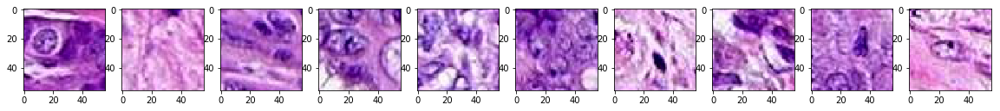

In [4]:
data = Data(dataset='nki', marker='he', patch_h=56, patch_w=56, n_channels=3, batch_size=10)
images, label = data.training.next_batch(10)

plot_images(plt_num=10, images=images, dim=20)

In [5]:
def model_inputs(image_width, image_height, image_channels, z_dim):
    real_images = tf.placeholder(dtype=tf.float32, shape=(None, image_width, image_height, image_channels), name='real_images')
    z_input = tf.placeholder(dtype=tf.float32, shape=(None, z_dim), name='z_input')
    learning_rate = tf.placeholder(dtype=tf.float32, name='learning_rate')
    return real_images, z_input, learning_rate

In [6]:
def discriminator(images, reuse, alpha, use_bn):
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Padding = 'Same' -> H_new = H_old // Stride
        
        # Input Shape = (None, 56, 56, 3)
        
        # Conv.
        net = tf.layers.conv2d(inputs=images, filters=64, kernel_size=(5,5), strides=(2, 2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), name='c1')
        net = leakyReLU(net, alpha)
        # Shape = (None, 28, 28, 64)
        
        # Conv.
        net = tf.layers.conv2d(inputs=net, filters=128, kernel_size=(5,5), strides=(2, 2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), name='c2')
        if use_bn: net = tf.layers.batch_normalization(inputs=net, training=True)
        net = leakyReLU(net, alpha)
        # Shape = (None, 14, 14, 128)
        
        # Conv.
        net = tf.layers.conv2d(inputs=net, filters=256, kernel_size=(5,5), strides=(2, 2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), name='c3')
        if use_bn: net = tf.layers.batch_normalization(inputs=net, training=True)
        net = leakyReLU(net, alpha)
        # Shape = (None, 7, 7, 256)

        # Flatten.
        net = tf.layers.flatten(inputs=net, name='flatten')
        # Shape = (None, 7*7*256)

        # Dense.
        net = tf.layers.dense(inputs=net, units=1024, activation=None)
        if use_bn: net = tf.layers.batch_normalization(inputs=net, training=True)
        net = leakyReLU(net, alpha)
        # Shape = (None, 1024)
        
        # Dense
        logits = tf.layers.dense(inputs=net, units=1, activation=None)
        # Shape = (None, 1)
        output = tf.nn.sigmoid(x=logits)
        
        return output, logits

In [7]:
def generator(z_input, out_channel_dim, reuse, is_train, alpha):
    
    with tf.variable_scope('generator', reuse=reuse):
        # Doesn't work ReLU, tried.
        
        # Input Shape = (None, 100)
        
        # Dense.
        net = tf.layers.dense(inputs=z_input, units=1024, activation=None)
        net = tf.layers.batch_normalization(inputs=net, training=is_train)
        net = leakyReLU(net, alpha)
        # Shape = (None, 1024)
        
        # Dense.
        net = tf.layers.dense(net, 256*7*7, activation=None)
        net = tf.layers.batch_normalization(inputs=net, training=is_train)
        net = leakyReLU(net, alpha)
        # Shape = (None, 256*7*7)
        
        # Reshape
        net = tf.reshape(tensor=net, shape=(-1, 7, 7, 256), name='reshape')
        # Shape = (None, 7, 7, 256)
        
        # Conv.
        net = tf.layers.conv2d_transpose(inputs=net, filters=256, kernel_size=(5,5), strides=(2,2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), name='c1')
        net = tf.layers.batch_normalization(inputs=net, training=is_train)
        net = leakyReLU(net, alpha)
        # Shape = (None, 14, 14, 256)
        
        # Conv.
        net = tf.layers.conv2d_transpose(inputs=net, filters=128, kernel_size=(5,5), strides=(1,1), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), name='c2')
        net = tf.layers.batch_normalization(inputs=net, training=is_train)
        net = leakyReLU(net, alpha)
        # Shape = (None, 14, 14, 128)
        
        # Conv.
        net = tf.layers.conv2d_transpose(inputs=net, filters=128, kernel_size=(5,5), strides=(2,2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), name='c3')
        net = tf.layers.batch_normalization(inputs=net, training=is_train)
        net = leakyReLU(net, alpha)
        # Shape = (None, 28, 28, 128)
        
        logits = tf.layers.conv2d_transpose(inputs=net, filters=out_channel_dim, kernel_size=(5,5), strides=(2,2), padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer(), name='logits')
        # Shape = (None, 56, 56, 3)
        output = tf.nn.sigmoid(x=logits, name='output')
        
        return output

In [8]:
def show_generated(session, output_fake, n_images, z_input):
    z_dim = z_input.get_shape()[-1]
    sample_z = np.random.uniform(low=-1., high=1., size=(n_images, z_dim))
    feed_dict = {z_input:sample_z}
    gen_samples = session.run(output_fake, feed_dict=feed_dict)
    plot_images(plt_num=n_images, images=gen_samples, dim=20)    
    return gen_samples, sample_z

In [9]:
def save_loss(losses, data_out_path, dim):    
    mpl.rcParams["figure.figsize"] = dim, dim
    plt.rcParams.update({'font.size': 22})
    losses = np.array(losses)
    plt.plot(losses[:, 0], label='Discriminator', alpha=0.5)
    plt.plot(losses[:, 1], label='Generator', alpha=0.5)
    plt.title("Training Losses")
    plt.legend()
    plt.savefig('%s/training_loss.png' % data_out_path)

In [10]:
def setup_output(show_epochs, epochs, data, n_images, image_height, image_width, image_channels, z_dim, data_out_path):
    checkpoints_path = os.path.join(data_out_path, 'checkpoints')
    checkpoints = os.path.join(checkpoints_path, 'DCGAN.ckt')
    gen_images_path = os.path.join(data_out_path, 'images')
    gen_images = os.path.join(gen_images_path, 'gen_images.h5')
    latent_images = os.path.join(gen_images_path, 'latent_images.h5')
    if os.path.isdir(checkpoints_path):
         shutil.rmtree(checkpoints_path)
    if os.path.isdir(gen_images_path):
         shutil.rmtree(gen_images_path)
    os.makedirs(checkpoints_path)
    os.makedirs(gen_images_path)

    size_img = (epochs*data.training.iterations)//show_epochs
    img_db_shape = (size_img, n_images, image_height, image_width, image_channels)
    latent_db_shape = (size_img, n_images, z_dim)
    hdf5_gen = h5py.File(gen_images, mode='w')
    hdf5_latent = h5py.File(latent_images, mode='w')
    img_storage = hdf5_gen.create_dataset(name='generated_img', shape=img_db_shape, dtype=np.float32)
    latent_storage = hdf5_latent.create_dataset(name='generated_img', shape=latent_db_shape, dtype=np.float32)
    return img_storage, latent_storage, checkpoints

In [11]:
def loss(real_images, z_input, out_channel_dim, alpha, use_bn):
    
    # Generator.
    fake_images = generator(z_input, out_channel_dim=out_channel_dim, reuse=False, is_train=True, alpha=alpha)
    
    # Discriminator.
    output_fake, logits_fake = discriminator(images=fake_images, reuse=False, alpha=alpha, use_bn=use_bn) 
    output_real, logits_real = discriminator(images=real_images, reuse=True, alpha=alpha, use_bn=use_bn)
    
    # Discriminator loss.
    loss_dis_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake, labels=tf.zeros_like(output_fake)))
    loss_dis_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_real, labels=tf.ones_like(output_fake)*0.9))
    loss_dis = loss_dis_fake + loss_dis_real

    # Generator loss.
    # This is where we implement -log[D(G(z))] instead log[1-D(G(z))].
    # Recall the implementation of cross-entropy, sign already in. 
    loss_gen = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=logits_fake, labels=tf.ones_like(output_fake)))
    
    return loss_dis, loss_gen

In [12]:
def optimization(loss_dis, loss_gen, learning_rate, beta1):
    trainable_variables = tf.trainable_variables()
    generator_variables = [variable for variable in trainable_variables if variable.name.startswith('generator')]
    discriminator_variables = [variable for variable in trainable_variables if variable.name.startswith('discriminator')]
    
    # Handling Batch Normalization.
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        train_generator = tf.train.AdamOptimizer(learning_rate=learning_rate, 
                                                 beta1=beta1).minimize(loss_gen, var_list=generator_variables)
        train_discriminator = tf.train.AdamOptimizer(learning_rate=learning_rate, 
                                                     beta1=beta1).minimize(loss_dis, var_list=discriminator_variables)    
    return train_generator, train_discriminator

In [13]:
def train(epochs, batch_size, z_dim, learning_rate, beta1, data, alpha, image_width, image_height, image_channels, data_out_path, use_bn):
    
    real_images, z_input, learning_rate_input = model_inputs(image_width=image_width, image_height=image_height, image_channels=image_channels, z_dim=z_dim)
    loss_dis, loss_gen = loss(real_images=real_images, z_input=z_input, out_channel_dim=image_channels, alpha=alpha, use_bn=use_bn)
    train_generator, train_discriminator = optimization(loss_dis=loss_dis, loss_gen=loss_gen, learning_rate=learning_rate_input, beta1=beta1)
    
    output_gen = generator(z_input=z_input, out_channel_dim=image_channels, reuse=True, is_train=False, alpha=alpha)

    global losses 
    global samples 
    
    run_epochs = 0    
    show_epochs = 100
    print_epochs = 10
    n_images = 10
        
    losses = list()
    samples = list()

    saver = tf.train.Saver()
    
    img_storage, latent_storage, checkpoints = setup_output(show_epochs, epochs, data, n_images, image_height, image_width, image_channels, z_dim, data_out_path)
    
    with tf.Session() as session:
        session.run(tf.global_variables_initializer())
        for epoch in range(1, epochs+1):
            for batch_images, batch_labels in data.training:
                z_batch = np.random.uniform(low=-1., high=1., size=(batch_size, z_dim))
               
                feed_dict = {z_input:z_batch, real_images:batch_images, learning_rate_input: learning_rate}
                session.run(train_discriminator, feed_dict=feed_dict)
                session.run(train_generator, feed_dict=feed_dict)
               
                if run_epochs%print_epochs==0:
                    feed_dict = {z_input:z_batch, real_images:batch_images}
                    epoch_loss_dis = session.run(loss_dis, feed_dict=feed_dict)
                    epoch_loss_gen = session.run(loss_gen, feed_dict=feed_dict)
                    losses.append((epoch_loss_dis, epoch_loss_gen))
                    print('Epochs %s/%s: Generator Loss: %s. Discriminator Loss: %s' % (epoch, epochs, np.round(epoch_loss_gen, 3), np.round(epoch_loss_dis, 3)))
                if run_epochs%show_epochs == 0:
                    gen_samples, sample_z = show_generated(session=session, output_fake=output_gen, n_images=n_images, z_input=z_input)
                    img_storage[run_epochs//show_epochs] = gen_samples
                    latent_storage[run_epochs//show_epochs] = sample_z
                    saver.save(sess = session, save_path=checkpoints, global_step=run_epochs)
                
                run_epochs += 1
            data.training.reset()

Epochs 1/3: Generator Loss: 3.542. Discriminator Loss: 5.288


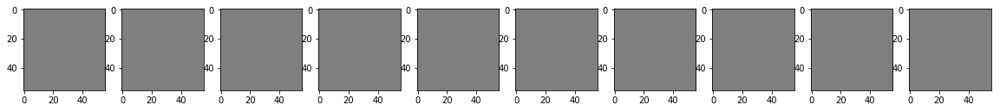

Epochs 1/3: Generator Loss: 4.262. Discriminator Loss: 5.063


Epochs 1/3: Generator Loss: 3.737. Discriminator Loss: 4.413


Epochs 1/3: Generator Loss: 3.456. Discriminator Loss: 4.11


Epochs 1/3: Generator Loss: 2.524. Discriminator Loss: 3.276


Epochs 1/3: Generator Loss: 1.989. Discriminator Loss: 2.628


Epochs 1/3: Generator Loss: 2.167. Discriminator Loss: 2.749


Epochs 1/3: Generator Loss: 1.877. Discriminator Loss: 2.47


Epochs 1/3: Generator Loss: 1.63. Discriminator Loss: 2.218


Epochs 1/3: Generator Loss: 0.958. Discriminator Loss: 1.634


Epochs 1/3: Generator Loss: 0.805. Discriminator Loss: 1.351


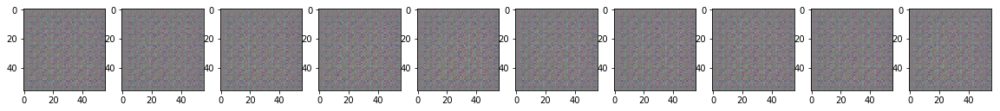

Epochs 1/3: Generator Loss: 0.798. Discriminator Loss: 1.339


Epochs 1/3: Generator Loss: 0.848. Discriminator Loss: 1.276


Epochs 1/3: Generator Loss: 0.871. Discriminator Loss: 1.249


Epochs 1/3: Generator Loss: 0.881. Discriminator Loss: 1.24


Epochs 1/3: Generator Loss: 0.913. Discriminator Loss: 1.012


Epochs 1/3: Generator Loss: 0.517. Discriminator Loss: 1.674


Epochs 1/3: Generator Loss: 0.726. Discriminator Loss: 1.377


Epochs 1/3: Generator Loss: 0.812. Discriminator Loss: 1.313


Epochs 1/3: Generator Loss: 0.821. Discriminator Loss: 1.31


Epochs 1/3: Generator Loss: 0.786. Discriminator Loss: 1.346


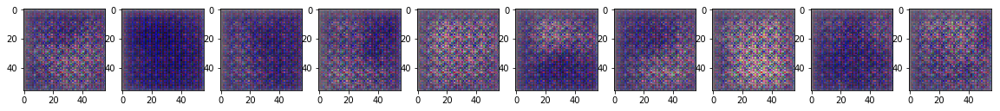

Epochs 1/3: Generator Loss: 0.724. Discriminator Loss: 1.447


Epochs 1/3: Generator Loss: 0.733. Discriminator Loss: 1.361


Epochs 1/3: Generator Loss: 0.762. Discriminator Loss: 1.385


Epochs 1/3: Generator Loss: 0.788. Discriminator Loss: 1.335


Epochs 1/3: Generator Loss: 0.762. Discriminator Loss: 1.372


Epochs 1/3: Generator Loss: 0.782. Discriminator Loss: 1.352


Epochs 1/3: Generator Loss: 0.757. Discriminator Loss: 1.345


Epochs 1/3: Generator Loss: 0.796. Discriminator Loss: 1.348


Epochs 1/3: Generator Loss: 0.73. Discriminator Loss: 1.418


Epochs 1/3: Generator Loss: 0.773. Discriminator Loss: 1.352


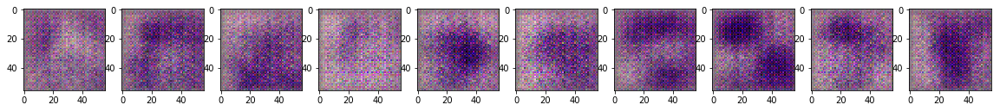

Epochs 1/3: Generator Loss: 0.819. Discriminator Loss: 1.331


Epochs 1/3: Generator Loss: 0.819. Discriminator Loss: 1.349


Epochs 1/3: Generator Loss: 0.775. Discriminator Loss: 1.346


Epochs 1/3: Generator Loss: 0.874. Discriminator Loss: 1.249


Epochs 1/3: Generator Loss: 0.774. Discriminator Loss: 1.294


Epochs 1/3: Generator Loss: 0.782. Discriminator Loss: 1.318


Epochs 1/3: Generator Loss: 0.771. Discriminator Loss: 1.413


Epochs 1/3: Generator Loss: 0.843. Discriminator Loss: 1.268


Epochs 1/3: Generator Loss: 0.828. Discriminator Loss: 1.266


Epochs 1/3: Generator Loss: 0.834. Discriminator Loss: 1.366


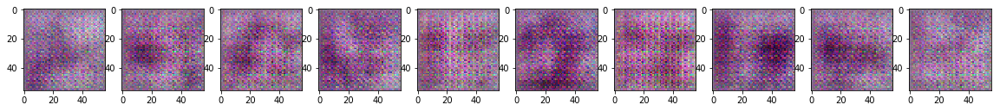

Epochs 1/3: Generator Loss: 0.797. Discriminator Loss: 1.323


Epochs 1/3: Generator Loss: 0.793. Discriminator Loss: 1.361


Epochs 1/3: Generator Loss: 0.804. Discriminator Loss: 1.254


Epochs 1/3: Generator Loss: 0.868. Discriminator Loss: 1.288


Epochs 1/3: Generator Loss: 0.814. Discriminator Loss: 1.373


Epochs 1/3: Generator Loss: 0.855. Discriminator Loss: 1.304


Epochs 1/3: Generator Loss: 0.88. Discriminator Loss: 1.346


Epochs 1/3: Generator Loss: 0.799. Discriminator Loss: 1.358


Epochs 1/3: Generator Loss: 0.821. Discriminator Loss: 1.318


Epochs 1/3: Generator Loss: 0.823. Discriminator Loss: 1.32


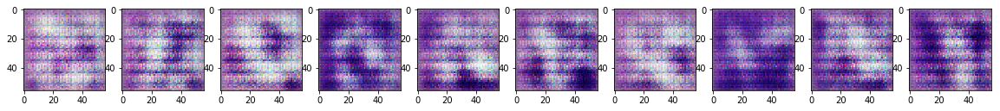

Epochs 1/3: Generator Loss: 0.767. Discriminator Loss: 1.344


Epochs 1/3: Generator Loss: 0.945. Discriminator Loss: 1.156


Epochs 1/3: Generator Loss: 0.96. Discriminator Loss: 1.357


Epochs 1/3: Generator Loss: 0.89. Discriminator Loss: 1.481


Epochs 1/3: Generator Loss: 0.787. Discriminator Loss: 1.404


Epochs 1/3: Generator Loss: 0.79. Discriminator Loss: 1.284


Epochs 1/3: Generator Loss: 0.836. Discriminator Loss: 1.194


Epochs 1/3: Generator Loss: 0.889. Discriminator Loss: 1.348


Epochs 1/3: Generator Loss: 0.859. Discriminator Loss: 1.408


Epochs 1/3: Generator Loss: 0.693. Discriminator Loss: 1.326


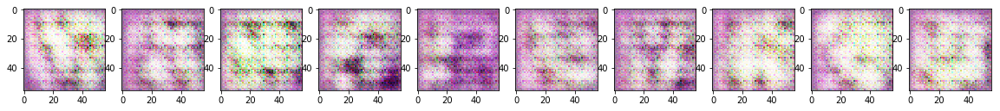

Epochs 1/3: Generator Loss: 0.868. Discriminator Loss: 1.251


Epochs 1/3: Generator Loss: 0.77. Discriminator Loss: 1.247


Epochs 1/3: Generator Loss: 0.962. Discriminator Loss: 1.273


Epochs 1/3: Generator Loss: 0.841. Discriminator Loss: 1.332


Epochs 1/3: Generator Loss: 0.801. Discriminator Loss: 1.279


Epochs 1/3: Generator Loss: 0.868. Discriminator Loss: 1.32


Epochs 1/3: Generator Loss: 0.771. Discriminator Loss: 1.233


Epochs 1/3: Generator Loss: 0.905. Discriminator Loss: 1.172


Epochs 1/3: Generator Loss: 0.871. Discriminator Loss: 1.289


Epochs 1/3: Generator Loss: 0.802. Discriminator Loss: 1.385


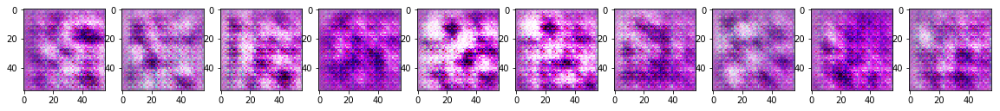

Epochs 1/3: Generator Loss: 0.899. Discriminator Loss: 1.383


Epochs 1/3: Generator Loss: 0.836. Discriminator Loss: 1.3


Epochs 1/3: Generator Loss: 0.671. Discriminator Loss: 1.389


Epochs 1/3: Generator Loss: 0.879. Discriminator Loss: 1.295


Epochs 1/3: Generator Loss: 0.996. Discriminator Loss: 1.181


Epochs 1/3: Generator Loss: 0.781. Discriminator Loss: 1.346


Epochs 1/3: Generator Loss: 0.773. Discriminator Loss: 1.295


Epochs 1/3: Generator Loss: 0.797. Discriminator Loss: 1.297


Epochs 1/3: Generator Loss: 0.871. Discriminator Loss: 1.289


Epochs 1/3: Generator Loss: 0.916. Discriminator Loss: 1.2


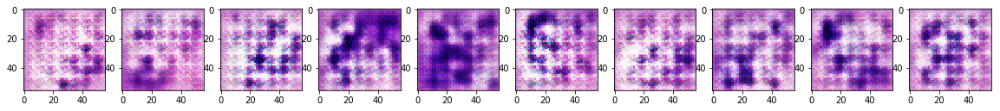

Epochs 1/3: Generator Loss: 0.9. Discriminator Loss: 1.211


Epochs 1/3: Generator Loss: 0.787. Discriminator Loss: 1.356


Epochs 1/3: Generator Loss: 0.893. Discriminator Loss: 1.197


Epochs 1/3: Generator Loss: 0.882. Discriminator Loss: 1.243


Epochs 1/3: Generator Loss: 0.755. Discriminator Loss: 1.238


Epochs 1/3: Generator Loss: 0.97. Discriminator Loss: 1.229


Epochs 1/3: Generator Loss: 0.878. Discriminator Loss: 1.241


Epochs 1/3: Generator Loss: 0.756. Discriminator Loss: 1.362


Epochs 1/3: Generator Loss: 0.683. Discriminator Loss: 1.482


Epochs 1/3: Generator Loss: 0.76. Discriminator Loss: 1.376


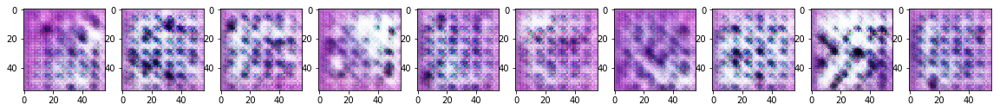

Epochs 1/3: Generator Loss: 0.725. Discriminator Loss: 1.44


Epochs 1/3: Generator Loss: 0.878. Discriminator Loss: 1.226


Epochs 1/3: Generator Loss: 0.722. Discriminator Loss: 1.294


Epochs 1/3: Generator Loss: 0.761. Discriminator Loss: 1.343


Epochs 1/3: Generator Loss: 0.73. Discriminator Loss: 1.222


Epochs 1/3: Generator Loss: 0.585. Discriminator Loss: 1.371


Epochs 1/3: Generator Loss: 0.843. Discriminator Loss: 1.315


Epochs 1/3: Generator Loss: 0.875. Discriminator Loss: 1.237


Epochs 1/3: Generator Loss: 0.791. Discriminator Loss: 1.335


Epochs 1/3: Generator Loss: 0.806. Discriminator Loss: 1.25


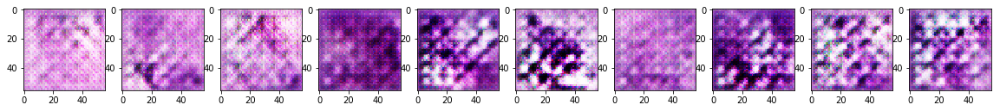

Epochs 1/3: Generator Loss: 0.828. Discriminator Loss: 1.306


Epochs 1/3: Generator Loss: 0.71. Discriminator Loss: 1.36


Epochs 1/3: Generator Loss: 0.87. Discriminator Loss: 1.452


Epochs 1/3: Generator Loss: 0.951. Discriminator Loss: 1.233


Epochs 1/3: Generator Loss: 0.847. Discriminator Loss: 1.316


Epochs 1/3: Generator Loss: 0.817. Discriminator Loss: 1.147


Epochs 1/3: Generator Loss: 0.779. Discriminator Loss: 1.276


Epochs 1/3: Generator Loss: 0.832. Discriminator Loss: 1.304


Epochs 1/3: Generator Loss: 0.762. Discriminator Loss: 1.402


Epochs 1/3: Generator Loss: 0.848. Discriminator Loss: 1.319


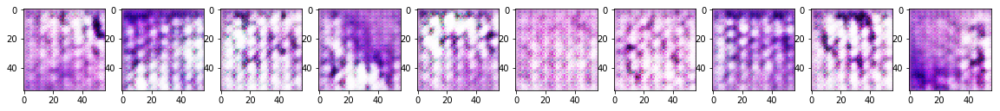

Epochs 1/3: Generator Loss: 0.727. Discriminator Loss: 1.362


Epochs 1/3: Generator Loss: 0.807. Discriminator Loss: 1.346


Epochs 1/3: Generator Loss: 0.894. Discriminator Loss: 1.293


Epochs 1/3: Generator Loss: 0.787. Discriminator Loss: 1.288


Epochs 1/3: Generator Loss: 0.772. Discriminator Loss: 1.361


Epochs 1/3: Generator Loss: 0.707. Discriminator Loss: 1.39


Epochs 1/3: Generator Loss: 0.745. Discriminator Loss: 1.286


Epochs 1/3: Generator Loss: 0.682. Discriminator Loss: 1.411


Epochs 1/3: Generator Loss: 0.838. Discriminator Loss: 1.27


Epochs 1/3: Generator Loss: 0.922. Discriminator Loss: 1.268


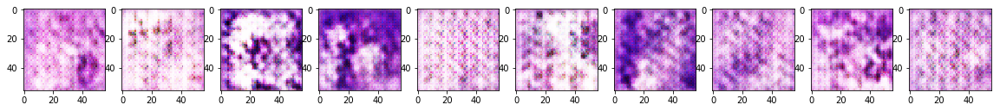

Epochs 1/3: Generator Loss: 0.825. Discriminator Loss: 1.358


Epochs 1/3: Generator Loss: 0.812. Discriminator Loss: 1.295


Epochs 1/3: Generator Loss: 0.772. Discriminator Loss: 1.281


Epochs 1/3: Generator Loss: 0.777. Discriminator Loss: 1.432


Epochs 1/3: Generator Loss: 0.713. Discriminator Loss: 1.379


Epochs 1/3: Generator Loss: 0.826. Discriminator Loss: 1.39


Epochs 1/3: Generator Loss: 0.856. Discriminator Loss: 1.32


Epochs 1/3: Generator Loss: 0.874. Discriminator Loss: 1.244


Epochs 1/3: Generator Loss: 0.757. Discriminator Loss: 1.241


Epochs 1/3: Generator Loss: 0.732. Discriminator Loss: 1.349


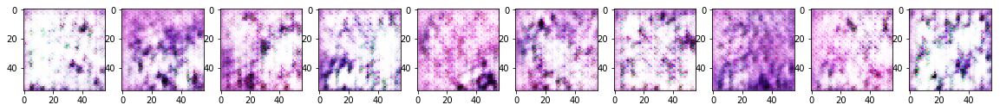

Epochs 1/3: Generator Loss: 0.772. Discriminator Loss: 1.26


Epochs 1/3: Generator Loss: 0.846. Discriminator Loss: 1.243


Epochs 1/3: Generator Loss: 0.843. Discriminator Loss: 1.386


Epochs 1/3: Generator Loss: 0.811. Discriminator Loss: 1.214


Epochs 1/3: Generator Loss: 0.797. Discriminator Loss: 1.276


Epochs 1/3: Generator Loss: 0.799. Discriminator Loss: 1.246


Epochs 1/3: Generator Loss: 0.968. Discriminator Loss: 0.955


Epochs 1/3: Generator Loss: 1.125. Discriminator Loss: 0.954


Epochs 1/3: Generator Loss: 0.714. Discriminator Loss: 1.444


Epochs 1/3: Generator Loss: 0.833. Discriminator Loss: 1.263


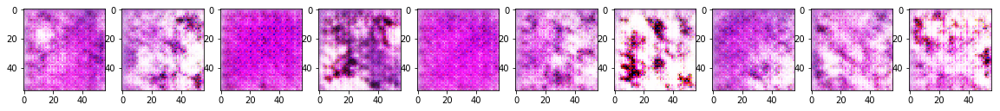

Epochs 1/3: Generator Loss: 0.785. Discriminator Loss: 1.434


Epochs 1/3: Generator Loss: 0.765. Discriminator Loss: 1.313


Epochs 1/3: Generator Loss: 0.756. Discriminator Loss: 1.36


Epochs 1/3: Generator Loss: 0.705. Discriminator Loss: 1.35


Epochs 1/3: Generator Loss: 0.718. Discriminator Loss: 1.491


Epochs 1/3: Generator Loss: 0.897. Discriminator Loss: 1.4


Epochs 1/3: Generator Loss: 0.786. Discriminator Loss: 1.28


Epochs 1/3: Generator Loss: 0.729. Discriminator Loss: 1.403


Epochs 1/3: Generator Loss: 0.729. Discriminator Loss: 1.35


Epochs 1/3: Generator Loss: 0.678. Discriminator Loss: 1.4


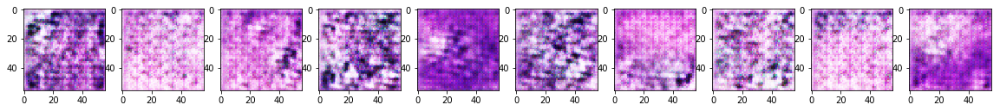

Epochs 1/3: Generator Loss: 0.78. Discriminator Loss: 1.28


Epochs 1/3: Generator Loss: 0.864. Discriminator Loss: 1.317


Epochs 1/3: Generator Loss: 0.82. Discriminator Loss: 1.31


Epochs 1/3: Generator Loss: 0.745. Discriminator Loss: 1.315


Epochs 1/3: Generator Loss: 0.893. Discriminator Loss: 1.249


Epochs 1/3: Generator Loss: 0.8. Discriminator Loss: 1.347


Epochs 1/3: Generator Loss: 0.776. Discriminator Loss: 1.343


Epochs 1/3: Generator Loss: 0.838. Discriminator Loss: 1.334


Epochs 1/3: Generator Loss: 0.778. Discriminator Loss: 1.264


Epochs 1/3: Generator Loss: 0.821. Discriminator Loss: 1.307


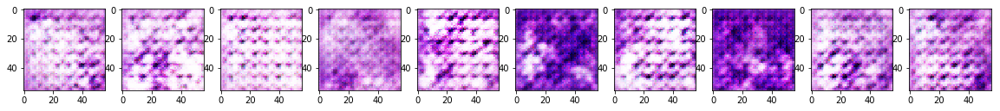

Epochs 1/3: Generator Loss: 0.734. Discriminator Loss: 1.374


Epochs 1/3: Generator Loss: 0.873. Discriminator Loss: 1.217


Epochs 1/3: Generator Loss: 0.756. Discriminator Loss: 1.29


Epochs 1/3: Generator Loss: 0.81. Discriminator Loss: 1.254


Epochs 1/3: Generator Loss: 0.867. Discriminator Loss: 1.352


Epochs 1/3: Generator Loss: 0.782. Discriminator Loss: 1.38


Epochs 1/3: Generator Loss: 0.78. Discriminator Loss: 1.257


Epochs 1/3: Generator Loss: 0.843. Discriminator Loss: 1.325


Epochs 1/3: Generator Loss: 0.792. Discriminator Loss: 1.289


Epochs 1/3: Generator Loss: 0.652. Discriminator Loss: 1.397


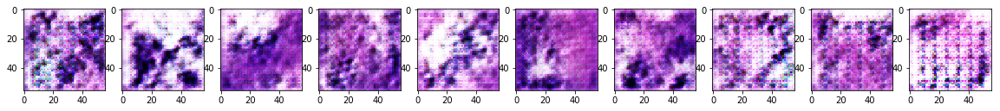

Epochs 1/3: Generator Loss: 0.834. Discriminator Loss: 1.227


Epochs 1/3: Generator Loss: 0.835. Discriminator Loss: 1.262


Epochs 1/3: Generator Loss: 0.76. Discriminator Loss: 1.288


Epochs 1/3: Generator Loss: 0.796. Discriminator Loss: 1.199


Epochs 1/3: Generator Loss: 0.943. Discriminator Loss: 1.321


Epochs 1/3: Generator Loss: 0.839. Discriminator Loss: 1.229


Epochs 1/3: Generator Loss: 0.722. Discriminator Loss: 1.305


Epochs 1/3: Generator Loss: 0.82. Discriminator Loss: 1.291


Epochs 1/3: Generator Loss: 0.868. Discriminator Loss: 1.295


Epochs 1/3: Generator Loss: 0.739. Discriminator Loss: 1.307


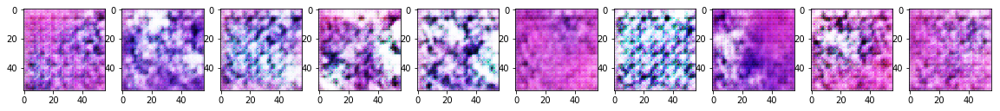

Epochs 1/3: Generator Loss: 0.788. Discriminator Loss: 1.328


Epochs 1/3: Generator Loss: 0.795. Discriminator Loss: 1.383


Epochs 1/3: Generator Loss: 0.779. Discriminator Loss: 1.317


Epochs 1/3: Generator Loss: 0.807. Discriminator Loss: 1.325


Epochs 1/3: Generator Loss: 0.716. Discriminator Loss: 1.336


Epochs 1/3: Generator Loss: 0.709. Discriminator Loss: 1.428


Epochs 1/3: Generator Loss: 0.755. Discriminator Loss: 1.209


Epochs 1/3: Generator Loss: 0.881. Discriminator Loss: 1.335


Epochs 1/3: Generator Loss: 0.702. Discriminator Loss: 1.359


Epochs 1/3: Generator Loss: 0.83. Discriminator Loss: 1.347


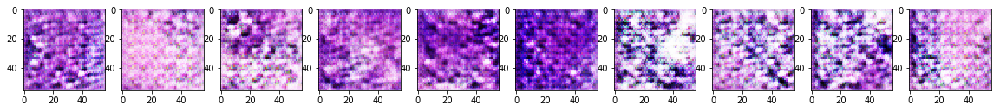

Epochs 1/3: Generator Loss: 0.799. Discriminator Loss: 1.303


Epochs 1/3: Generator Loss: 0.804. Discriminator Loss: 1.319


Epochs 1/3: Generator Loss: 0.765. Discriminator Loss: 1.302


Epochs 1/3: Generator Loss: 0.739. Discriminator Loss: 1.225


Epochs 1/3: Generator Loss: 0.898. Discriminator Loss: 1.058


Epochs 1/3: Generator Loss: 0.901. Discriminator Loss: 1.05


Epochs 1/3: Generator Loss: 0.788. Discriminator Loss: 1.329


Epochs 1/3: Generator Loss: 0.841. Discriminator Loss: 1.338


Epochs 1/3: Generator Loss: 0.718. Discriminator Loss: 1.315


Epochs 1/3: Generator Loss: 0.772. Discriminator Loss: 1.316


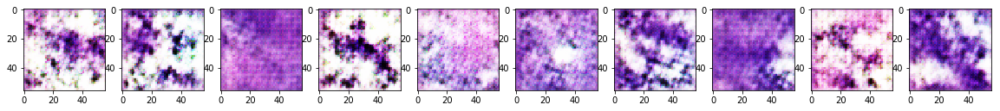

Epochs 1/3: Generator Loss: 0.794. Discriminator Loss: 1.375


Epochs 1/3: Generator Loss: 0.772. Discriminator Loss: 1.346


Epochs 1/3: Generator Loss: 0.778. Discriminator Loss: 1.329


Epochs 1/3: Generator Loss: 0.807. Discriminator Loss: 1.331


Epochs 1/3: Generator Loss: 0.808. Discriminator Loss: 1.202


Epochs 1/3: Generator Loss: 0.809. Discriminator Loss: 1.388


Epochs 1/3: Generator Loss: 0.911. Discriminator Loss: 1.325


Epochs 1/3: Generator Loss: 0.882. Discriminator Loss: 1.322


Epochs 1/3: Generator Loss: 0.726. Discriminator Loss: 1.377


Epochs 1/3: Generator Loss: 0.73. Discriminator Loss: 1.396


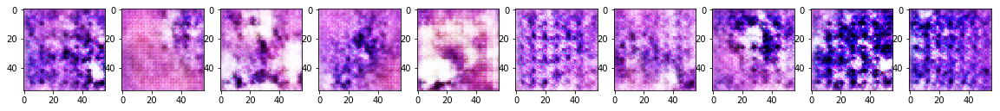

Epochs 1/3: Generator Loss: 0.812. Discriminator Loss: 1.231


Epochs 1/3: Generator Loss: 0.918. Discriminator Loss: 1.321


Epochs 1/3: Generator Loss: 0.563. Discriminator Loss: 1.442


Epochs 1/3: Generator Loss: 0.929. Discriminator Loss: 1.249


Epochs 1/3: Generator Loss: 0.771. Discriminator Loss: 1.334


Epochs 1/3: Generator Loss: 0.929. Discriminator Loss: 1.225


Epochs 1/3: Generator Loss: 0.845. Discriminator Loss: 1.205


Epochs 1/3: Generator Loss: 0.764. Discriminator Loss: 1.218


Epochs 1/3: Generator Loss: 0.877. Discriminator Loss: 1.321


Epochs 1/3: Generator Loss: 0.753. Discriminator Loss: 1.33


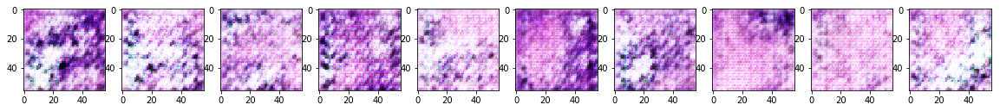

Epochs 1/3: Generator Loss: 0.744. Discriminator Loss: 1.439


Epochs 1/3: Generator Loss: 0.808. Discriminator Loss: 1.259


Epochs 1/3: Generator Loss: 0.793. Discriminator Loss: 1.243


Epochs 1/3: Generator Loss: 0.86. Discriminator Loss: 1.165


Epochs 1/3: Generator Loss: 0.78. Discriminator Loss: 1.287


Epochs 1/3: Generator Loss: 0.734. Discriminator Loss: 1.345


Epochs 1/3: Generator Loss: 0.774. Discriminator Loss: 1.218


Epochs 1/3: Generator Loss: 0.76. Discriminator Loss: 1.274


Epochs 1/3: Generator Loss: 0.665. Discriminator Loss: 1.544


Epochs 1/3: Generator Loss: 0.872. Discriminator Loss: 1.349


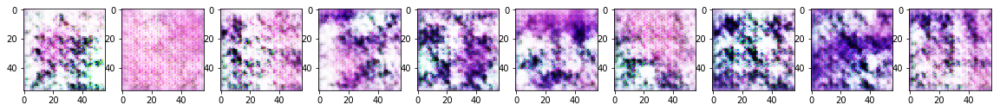

Epochs 1/3: Generator Loss: 0.724. Discriminator Loss: 1.456


Epochs 1/3: Generator Loss: 0.811. Discriminator Loss: 1.363


Epochs 1/3: Generator Loss: 0.725. Discriminator Loss: 1.453


Epochs 1/3: Generator Loss: 0.824. Discriminator Loss: 1.289


Epochs 1/3: Generator Loss: 0.859. Discriminator Loss: 1.282


Epochs 1/3: Generator Loss: 0.706. Discriminator Loss: 1.283


Epochs 1/3: Generator Loss: 0.766. Discriminator Loss: 1.44


Epochs 1/3: Generator Loss: 0.775. Discriminator Loss: 1.312


Epochs 1/3: Generator Loss: 0.79. Discriminator Loss: 1.285


Epochs 1/3: Generator Loss: 0.728. Discriminator Loss: 1.349


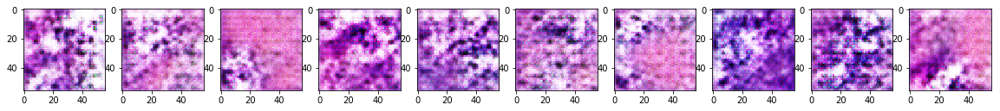

Epochs 1/3: Generator Loss: 0.891. Discriminator Loss: 1.227


Epochs 1/3: Generator Loss: 0.77. Discriminator Loss: 1.244


Epochs 1/3: Generator Loss: 0.74. Discriminator Loss: 1.397


Epochs 1/3: Generator Loss: 0.833. Discriminator Loss: 1.364


Epochs 1/3: Generator Loss: 0.842. Discriminator Loss: 1.428


Epochs 1/3: Generator Loss: 0.79. Discriminator Loss: 1.254


Epochs 1/3: Generator Loss: 0.692. Discriminator Loss: 1.379


Epochs 1/3: Generator Loss: 0.766. Discriminator Loss: 1.266


Epochs 1/3: Generator Loss: 0.889. Discriminator Loss: 1.294


Epochs 1/3: Generator Loss: 0.756. Discriminator Loss: 1.32


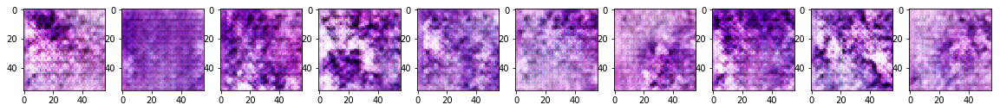

Epochs 1/3: Generator Loss: 0.812. Discriminator Loss: 1.333


Epochs 1/3: Generator Loss: 0.827. Discriminator Loss: 1.174


Epochs 1/3: Generator Loss: 0.711. Discriminator Loss: 1.36


Epochs 1/3: Generator Loss: 0.787. Discriminator Loss: 1.299


Epochs 1/3: Generator Loss: 0.797. Discriminator Loss: 1.268


Epochs 1/3: Generator Loss: 0.648. Discriminator Loss: 1.393


Epochs 1/3: Generator Loss: 0.841. Discriminator Loss: 1.313


Epochs 1/3: Generator Loss: 0.847. Discriminator Loss: 1.246


Epochs 1/3: Generator Loss: 0.882. Discriminator Loss: 1.13


Epochs 1/3: Generator Loss: 0.797. Discriminator Loss: 1.254


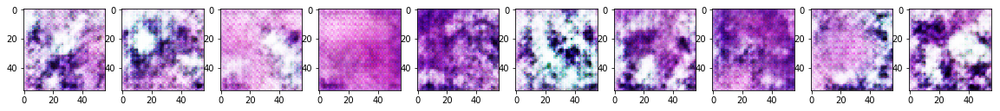

Epochs 1/3: Generator Loss: 0.833. Discriminator Loss: 1.262


Epochs 1/3: Generator Loss: 0.871. Discriminator Loss: 1.295


Epochs 1/3: Generator Loss: 0.708. Discriminator Loss: 1.343


Epochs 1/3: Generator Loss: 0.83. Discriminator Loss: 1.318


Epochs 1/3: Generator Loss: 0.74. Discriminator Loss: 1.316


Epochs 1/3: Generator Loss: 0.796. Discriminator Loss: 1.285


Epochs 1/3: Generator Loss: 0.802. Discriminator Loss: 1.267


Epochs 1/3: Generator Loss: 0.886. Discriminator Loss: 1.273


Epochs 1/3: Generator Loss: 0.789. Discriminator Loss: 1.283


Epochs 1/3: Generator Loss: 0.784. Discriminator Loss: 1.304


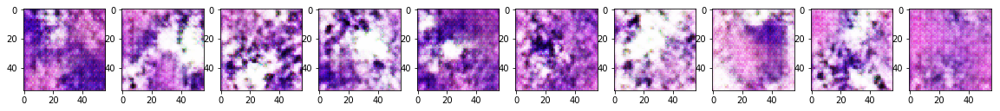

Epochs 1/3: Generator Loss: 0.753. Discriminator Loss: 1.342


Epochs 1/3: Generator Loss: 0.777. Discriminator Loss: 1.308


Epochs 1/3: Generator Loss: 0.823. Discriminator Loss: 1.229


Epochs 1/3: Generator Loss: 0.819. Discriminator Loss: 1.309


Epochs 1/3: Generator Loss: 0.729. Discriminator Loss: 1.318


Epochs 1/3: Generator Loss: 0.73. Discriminator Loss: 1.361


Epochs 1/3: Generator Loss: 0.813. Discriminator Loss: 1.236


Epochs 1/3: Generator Loss: 0.787. Discriminator Loss: 1.371


Epochs 1/3: Generator Loss: 0.92. Discriminator Loss: 1.277


Epochs 1/3: Generator Loss: 0.752. Discriminator Loss: 1.275


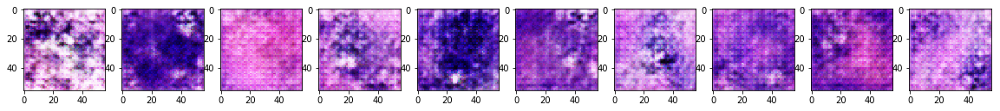

Epochs 1/3: Generator Loss: 0.95. Discriminator Loss: 1.124


Epochs 1/3: Generator Loss: 0.857. Discriminator Loss: 1.27


Epochs 1/3: Generator Loss: 0.759. Discriminator Loss: 1.32


Epochs 1/3: Generator Loss: 0.826. Discriminator Loss: 1.359


Epochs 1/3: Generator Loss: 0.823. Discriminator Loss: 1.289


Epochs 1/3: Generator Loss: 0.813. Discriminator Loss: 1.215


Epochs 1/3: Generator Loss: 0.799. Discriminator Loss: 1.329


Epochs 1/3: Generator Loss: 0.845. Discriminator Loss: 1.338


Epochs 1/3: Generator Loss: 0.816. Discriminator Loss: 1.358


Epochs 1/3: Generator Loss: 0.768. Discriminator Loss: 1.318


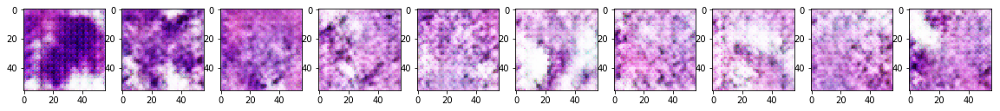

Epochs 1/3: Generator Loss: 0.828. Discriminator Loss: 1.293


Epochs 1/3: Generator Loss: 0.835. Discriminator Loss: 1.254


Epochs 1/3: Generator Loss: 0.759. Discriminator Loss: 1.325


Epochs 1/3: Generator Loss: 0.823. Discriminator Loss: 1.22


Epochs 1/3: Generator Loss: 0.695. Discriminator Loss: 1.283


Epochs 1/3: Generator Loss: 0.77. Discriminator Loss: 1.393


Epochs 1/3: Generator Loss: 0.78. Discriminator Loss: 1.266


Epochs 1/3: Generator Loss: 0.824. Discriminator Loss: 1.293


Epochs 1/3: Generator Loss: 0.813. Discriminator Loss: 1.315


Epochs 1/3: Generator Loss: 0.775. Discriminator Loss: 1.327


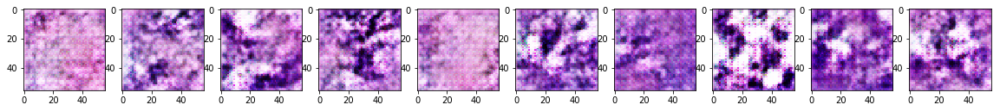

Epochs 1/3: Generator Loss: 0.892. Discriminator Loss: 1.257


Epochs 1/3: Generator Loss: 0.721. Discriminator Loss: 1.38


Epochs 1/3: Generator Loss: 0.843. Discriminator Loss: 1.253


Epochs 1/3: Generator Loss: 0.785. Discriminator Loss: 1.264


Epochs 1/3: Generator Loss: 0.822. Discriminator Loss: 1.218


Epochs 1/3: Generator Loss: 0.781. Discriminator Loss: 1.322


Epochs 1/3: Generator Loss: 0.953. Discriminator Loss: 1.371


Epochs 1/3: Generator Loss: 0.792. Discriminator Loss: 1.27


Epochs 1/3: Generator Loss: 0.774. Discriminator Loss: 1.334


Epochs 1/3: Generator Loss: 0.819. Discriminator Loss: 1.346


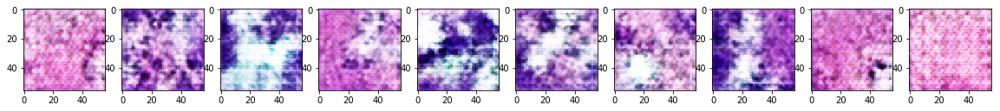

Epochs 1/3: Generator Loss: 0.772. Discriminator Loss: 1.361


Epochs 1/3: Generator Loss: 0.756. Discriminator Loss: 1.363


Epochs 1/3: Generator Loss: 0.716. Discriminator Loss: 1.328


Epochs 1/3: Generator Loss: 0.849. Discriminator Loss: 1.234


Epochs 1/3: Generator Loss: 0.707. Discriminator Loss: 1.312


Epochs 1/3: Generator Loss: 0.798. Discriminator Loss: 1.174


Epochs 1/3: Generator Loss: 0.729. Discriminator Loss: 1.362


Epochs 1/3: Generator Loss: 0.744. Discriminator Loss: 1.303


Epochs 1/3: Generator Loss: 0.731. Discriminator Loss: 1.416


Epochs 1/3: Generator Loss: 0.747. Discriminator Loss: 1.454


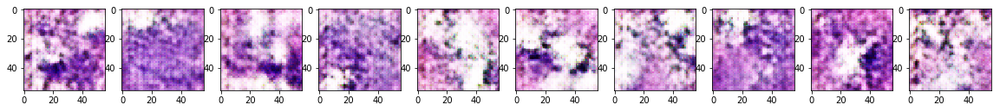

Epochs 1/3: Generator Loss: 0.742. Discriminator Loss: 1.266


Epochs 1/3: Generator Loss: 0.804. Discriminator Loss: 1.248


Epochs 1/3: Generator Loss: 0.817. Discriminator Loss: 1.272


Epochs 1/3: Generator Loss: 1.001. Discriminator Loss: 1.268


Epochs 1/3: Generator Loss: 0.706. Discriminator Loss: 1.372


Epochs 1/3: Generator Loss: 0.753. Discriminator Loss: 1.371


Epochs 1/3: Generator Loss: 0.816. Discriminator Loss: 1.344


Epochs 1/3: Generator Loss: 0.837. Discriminator Loss: 1.247


Epochs 1/3: Generator Loss: 0.878. Discriminator Loss: 1.227


Epochs 1/3: Generator Loss: 0.862. Discriminator Loss: 1.212


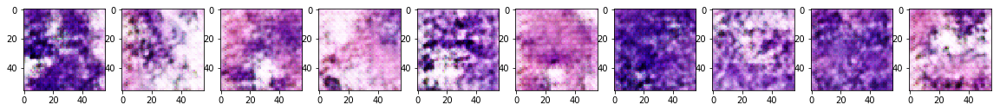

Epochs 1/3: Generator Loss: 0.792. Discriminator Loss: 1.377


Epochs 1/3: Generator Loss: 0.82. Discriminator Loss: 1.201


Epochs 1/3: Generator Loss: 0.865. Discriminator Loss: 1.169


Epochs 1/3: Generator Loss: 0.828. Discriminator Loss: 1.205


Epochs 1/3: Generator Loss: 0.777. Discriminator Loss: 1.216


Epochs 1/3: Generator Loss: 0.875. Discriminator Loss: 1.314


Epochs 1/3: Generator Loss: 0.914. Discriminator Loss: 1.192


Epochs 1/3: Generator Loss: 0.805. Discriminator Loss: 1.256


Epochs 1/3: Generator Loss: 0.815. Discriminator Loss: 1.34


Epochs 1/3: Generator Loss: 0.827. Discriminator Loss: 1.161


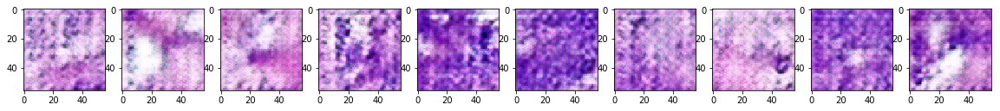

Epochs 1/3: Generator Loss: 0.816. Discriminator Loss: 1.224


Epochs 1/3: Generator Loss: 0.915. Discriminator Loss: 1.238


Epochs 1/3: Generator Loss: 0.81. Discriminator Loss: 1.27


Epochs 1/3: Generator Loss: 0.719. Discriminator Loss: 1.273


Epochs 1/3: Generator Loss: 0.802. Discriminator Loss: 1.304


Epochs 1/3: Generator Loss: 0.78. Discriminator Loss: 1.425


Epochs 1/3: Generator Loss: 0.87. Discriminator Loss: 1.169


Epochs 1/3: Generator Loss: 0.762. Discriminator Loss: 1.258


Epochs 1/3: Generator Loss: 0.823. Discriminator Loss: 1.254


Epochs 1/3: Generator Loss: 0.884. Discriminator Loss: 1.259


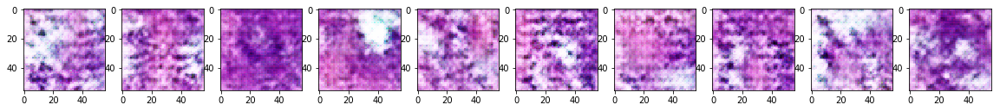

Epochs 1/3: Generator Loss: 0.716. Discriminator Loss: 1.385


Epochs 1/3: Generator Loss: 0.789. Discriminator Loss: 1.36


Epochs 1/3: Generator Loss: 0.856. Discriminator Loss: 1.413


Epochs 1/3: Generator Loss: 0.79. Discriminator Loss: 1.219


Epochs 1/3: Generator Loss: 0.876. Discriminator Loss: 1.2


Epochs 1/3: Generator Loss: 0.768. Discriminator Loss: 1.206


Epochs 1/3: Generator Loss: 0.788. Discriminator Loss: 1.295


Epochs 1/3: Generator Loss: 0.875. Discriminator Loss: 1.288


Epochs 1/3: Generator Loss: 0.886. Discriminator Loss: 1.257


Epochs 1/3: Generator Loss: 0.853. Discriminator Loss: 1.245


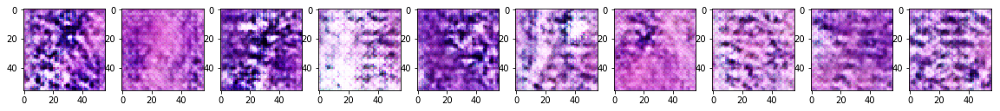

Epochs 1/3: Generator Loss: 0.72. Discriminator Loss: 1.262


Epochs 1/3: Generator Loss: 0.746. Discriminator Loss: 1.482


Epochs 1/3: Generator Loss: 0.877. Discriminator Loss: 1.235


Epochs 1/3: Generator Loss: 0.912. Discriminator Loss: 1.14


Epochs 1/3: Generator Loss: 0.757. Discriminator Loss: 1.378


Epochs 1/3: Generator Loss: 0.873. Discriminator Loss: 1.167


Epochs 1/3: Generator Loss: 0.764. Discriminator Loss: 1.187


Epochs 1/3: Generator Loss: 0.828. Discriminator Loss: 1.242


Epochs 1/3: Generator Loss: 0.907. Discriminator Loss: 1.135


Epochs 1/3: Generator Loss: 0.853. Discriminator Loss: 1.173


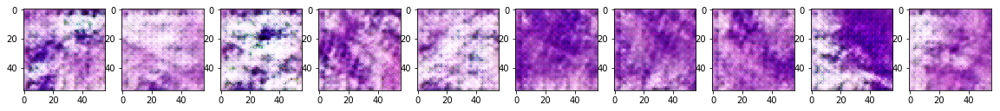

Epochs 1/3: Generator Loss: 0.857. Discriminator Loss: 1.24


Epochs 1/3: Generator Loss: 0.779. Discriminator Loss: 1.248


Epochs 1/3: Generator Loss: 0.639. Discriminator Loss: 1.495


Epochs 1/3: Generator Loss: 0.875. Discriminator Loss: 1.268


Epochs 1/3: Generator Loss: 0.884. Discriminator Loss: 1.293


Epochs 1/3: Generator Loss: 0.9. Discriminator Loss: 1.401


Epochs 1/3: Generator Loss: 0.754. Discriminator Loss: 1.297


Epochs 1/3: Generator Loss: 0.913. Discriminator Loss: 1.138


Epochs 1/3: Generator Loss: 0.708. Discriminator Loss: 1.317


Epochs 1/3: Generator Loss: 1.001. Discriminator Loss: 1.19


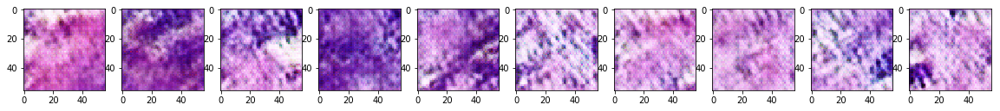

Epochs 1/3: Generator Loss: 0.864. Discriminator Loss: 1.243


Epochs 1/3: Generator Loss: 0.756. Discriminator Loss: 1.336


Epochs 1/3: Generator Loss: 0.839. Discriminator Loss: 1.318


Epochs 1/3: Generator Loss: 0.86. Discriminator Loss: 1.356


Epochs 1/3: Generator Loss: 0.832. Discriminator Loss: 1.231


Epochs 1/3: Generator Loss: 0.842. Discriminator Loss: 1.161


Epochs 1/3: Generator Loss: 0.997. Discriminator Loss: 1.191


Epochs 1/3: Generator Loss: 0.799. Discriminator Loss: 1.272


Epochs 1/3: Generator Loss: 0.855. Discriminator Loss: 1.269


Epochs 1/3: Generator Loss: 0.711. Discriminator Loss: 1.351


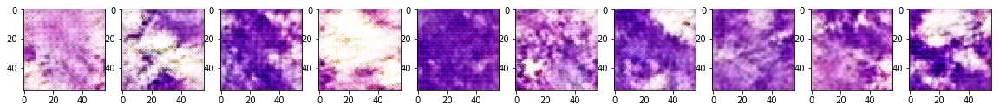

Epochs 1/3: Generator Loss: 0.7. Discriminator Loss: 1.388


Epochs 1/3: Generator Loss: 0.799. Discriminator Loss: 1.383


Epochs 1/3: Generator Loss: 0.92. Discriminator Loss: 1.131


Epochs 1/3: Generator Loss: 0.819. Discriminator Loss: 1.243


Epochs 1/3: Generator Loss: 0.96. Discriminator Loss: 1.239


Epochs 1/3: Generator Loss: 0.79. Discriminator Loss: 1.256


Epochs 1/3: Generator Loss: 0.729. Discriminator Loss: 1.317


Epochs 1/3: Generator Loss: 0.74. Discriminator Loss: 1.275


Epochs 1/3: Generator Loss: 0.733. Discriminator Loss: 1.344


Epochs 1/3: Generator Loss: 0.898. Discriminator Loss: 1.269


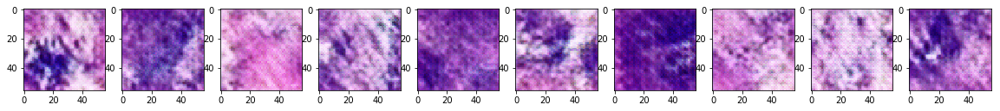

Epochs 1/3: Generator Loss: 0.844. Discriminator Loss: 1.184


Epochs 1/3: Generator Loss: 0.851. Discriminator Loss: 1.219


Epochs 1/3: Generator Loss: 0.811. Discriminator Loss: 1.221


Epochs 1/3: Generator Loss: 0.85. Discriminator Loss: 1.183


Epochs 1/3: Generator Loss: 0.765. Discriminator Loss: 1.298


Epochs 1/3: Generator Loss: 0.837. Discriminator Loss: 1.253


Epochs 1/3: Generator Loss: 0.761. Discriminator Loss: 1.317


Epochs 1/3: Generator Loss: 0.777. Discriminator Loss: 1.244


Epochs 1/3: Generator Loss: 0.85. Discriminator Loss: 1.296


Epochs 1/3: Generator Loss: 0.947. Discriminator Loss: 1.184


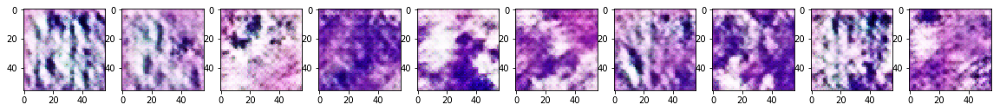

Epochs 1/3: Generator Loss: 0.804. Discriminator Loss: 1.166


Epochs 1/3: Generator Loss: 0.936. Discriminator Loss: 1.204


Epochs 1/3: Generator Loss: 0.785. Discriminator Loss: 1.285


Epochs 1/3: Generator Loss: 0.782. Discriminator Loss: 1.213


Epochs 1/3: Generator Loss: 0.786. Discriminator Loss: 1.2


Epochs 1/3: Generator Loss: 0.873. Discriminator Loss: 1.189


Epochs 1/3: Generator Loss: 0.938. Discriminator Loss: 1.111


Epochs 1/3: Generator Loss: 0.7. Discriminator Loss: 1.33


Epochs 1/3: Generator Loss: 0.788. Discriminator Loss: 1.2


Epochs 1/3: Generator Loss: 0.856. Discriminator Loss: 1.291


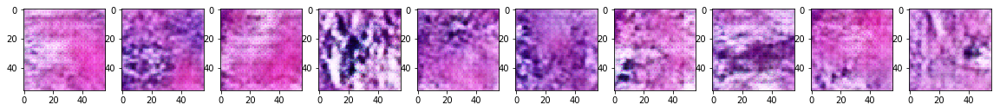

Epochs 1/3: Generator Loss: 0.91. Discriminator Loss: 1.207


Epochs 1/3: Generator Loss: 0.823. Discriminator Loss: 1.439


Epochs 1/3: Generator Loss: 0.722. Discriminator Loss: 1.4


Epochs 1/3: Generator Loss: 0.919. Discriminator Loss: 1.107


Epochs 1/3: Generator Loss: 1.121. Discriminator Loss: 1.264


Epochs 1/3: Generator Loss: 0.938. Discriminator Loss: 1.145


Epochs 1/3: Generator Loss: 0.692. Discriminator Loss: 1.277


Epochs 1/3: Generator Loss: 0.692. Discriminator Loss: 1.219


Epochs 1/3: Generator Loss: 0.865. Discriminator Loss: 1.204


Epochs 1/3: Generator Loss: 0.917. Discriminator Loss: 1.327


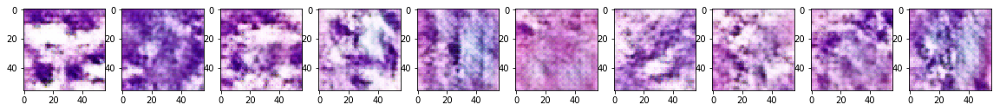

Epochs 1/3: Generator Loss: 0.854. Discriminator Loss: 1.22


Epochs 1/3: Generator Loss: 0.85. Discriminator Loss: 1.21


Epochs 1/3: Generator Loss: 0.744. Discriminator Loss: 1.227


Epochs 1/3: Generator Loss: 0.873. Discriminator Loss: 1.279


Epochs 1/3: Generator Loss: 0.834. Discriminator Loss: 1.237


Epochs 1/3: Generator Loss: 0.762. Discriminator Loss: 1.259


Epochs 1/3: Generator Loss: 0.854. Discriminator Loss: 1.154


Epochs 1/3: Generator Loss: 0.955. Discriminator Loss: 1.057


Epochs 1/3: Generator Loss: 0.791. Discriminator Loss: 1.258


Epochs 1/3: Generator Loss: 0.737. Discriminator Loss: 1.353


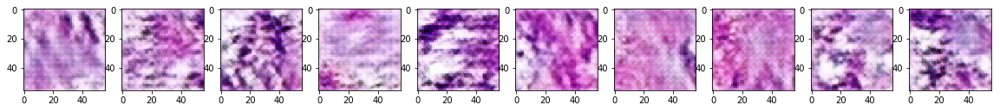

Epochs 1/3: Generator Loss: 0.852. Discriminator Loss: 1.303


Epochs 1/3: Generator Loss: 0.766. Discriminator Loss: 1.258


Epochs 1/3: Generator Loss: 0.82. Discriminator Loss: 1.242


Epochs 1/3: Generator Loss: 0.749. Discriminator Loss: 1.184


Epochs 1/3: Generator Loss: 0.777. Discriminator Loss: 1.267


Epochs 1/3: Generator Loss: 0.841. Discriminator Loss: 1.211


Epochs 1/3: Generator Loss: 0.839. Discriminator Loss: 1.302


Epochs 1/3: Generator Loss: 0.768. Discriminator Loss: 1.365


Epochs 1/3: Generator Loss: 1.008. Discriminator Loss: 1.281


Epochs 1/3: Generator Loss: 0.688. Discriminator Loss: 1.257


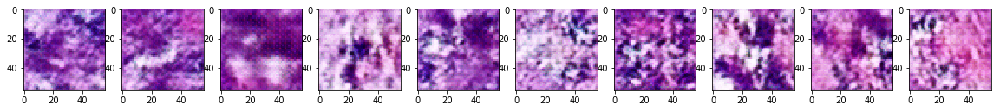

Epochs 1/3: Generator Loss: 1.083. Discriminator Loss: 1.219


Epochs 1/3: Generator Loss: 0.906. Discriminator Loss: 1.227


Epochs 1/3: Generator Loss: 0.832. Discriminator Loss: 1.256


Epochs 1/3: Generator Loss: 0.987. Discriminator Loss: 1.242


Epochs 1/3: Generator Loss: 0.872. Discriminator Loss: 1.184


Epochs 1/3: Generator Loss: 0.766. Discriminator Loss: 1.248


Epochs 1/3: Generator Loss: 0.875. Discriminator Loss: 1.202


Epochs 1/3: Generator Loss: 0.789. Discriminator Loss: 1.243


Epochs 1/3: Generator Loss: 0.736. Discriminator Loss: 1.332


Epochs 1/3: Generator Loss: 0.838. Discriminator Loss: 1.151


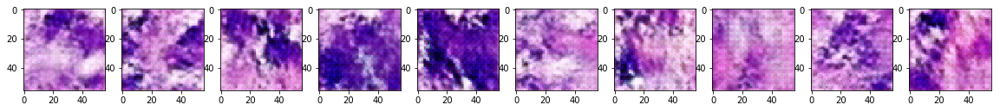

Epochs 1/3: Generator Loss: 0.931. Discriminator Loss: 1.208


Epochs 1/3: Generator Loss: 0.884. Discriminator Loss: 1.232


Epochs 1/3: Generator Loss: 0.863. Discriminator Loss: 1.104


Epochs 1/3: Generator Loss: 1.183. Discriminator Loss: 1.036


Epochs 1/3: Generator Loss: 0.922. Discriminator Loss: 1.093


Epochs 1/3: Generator Loss: 0.83. Discriminator Loss: 1.128


Epochs 1/3: Generator Loss: 1.366. Discriminator Loss: 1.201


Epochs 1/3: Generator Loss: 0.947. Discriminator Loss: 1.2


Epochs 1/3: Generator Loss: 1.145. Discriminator Loss: 1.097


Epochs 1/3: Generator Loss: 0.853. Discriminator Loss: 1.285


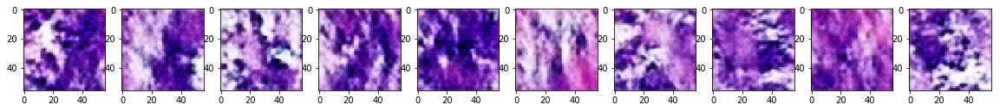

Epochs 1/3: Generator Loss: 0.86. Discriminator Loss: 1.128


Epochs 1/3: Generator Loss: 0.908. Discriminator Loss: 1.278


Epochs 1/3: Generator Loss: 0.927. Discriminator Loss: 1.172


Epochs 1/3: Generator Loss: 0.852. Discriminator Loss: 1.239


Epochs 1/3: Generator Loss: 0.762. Discriminator Loss: 1.153


Epochs 1/3: Generator Loss: 0.912. Discriminator Loss: 1.104


Epochs 1/3: Generator Loss: 0.665. Discriminator Loss: 1.185


Epochs 1/3: Generator Loss: 1.085. Discriminator Loss: 1.107


Epochs 1/3: Generator Loss: 0.867. Discriminator Loss: 1.233


Epochs 1/3: Generator Loss: 0.909. Discriminator Loss: 1.279


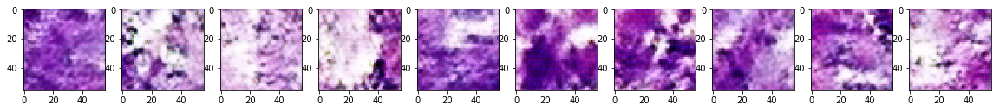

Epochs 1/3: Generator Loss: 0.989. Discriminator Loss: 1.057


Epochs 1/3: Generator Loss: 1.5. Discriminator Loss: 1.115


Epochs 1/3: Generator Loss: 0.927. Discriminator Loss: 1.326


Epochs 1/3: Generator Loss: 0.967. Discriminator Loss: 1.116


Epochs 1/3: Generator Loss: 0.861. Discriminator Loss: 1.079


Epochs 1/3: Generator Loss: 1.151. Discriminator Loss: 1.138


Epochs 1/3: Generator Loss: 1.023. Discriminator Loss: 1.069


Epochs 1/3: Generator Loss: 0.917. Discriminator Loss: 1.034


Epochs 1/3: Generator Loss: 0.84. Discriminator Loss: 1.102


Epochs 1/3: Generator Loss: 1.024. Discriminator Loss: 0.982


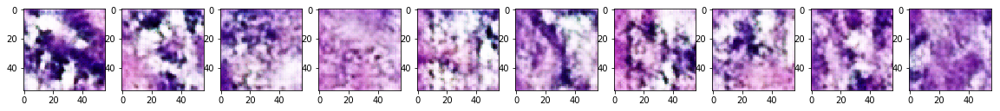

Epochs 1/3: Generator Loss: 1.14. Discriminator Loss: 0.936


Epochs 1/3: Generator Loss: 1.171. Discriminator Loss: 1.162


Epochs 1/3: Generator Loss: 1.199. Discriminator Loss: 1.007


Epochs 1/3: Generator Loss: 1.219. Discriminator Loss: 0.968


Epochs 1/3: Generator Loss: 0.946. Discriminator Loss: 1.102


Epochs 1/3: Generator Loss: 1.485. Discriminator Loss: 0.849


Epochs 1/3: Generator Loss: 1.438. Discriminator Loss: 0.729


Epochs 1/3: Generator Loss: 1.143. Discriminator Loss: 0.884


Epochs 1/3: Generator Loss: 1.084. Discriminator Loss: 1.014


Epochs 1/3: Generator Loss: 1.096. Discriminator Loss: 1.008


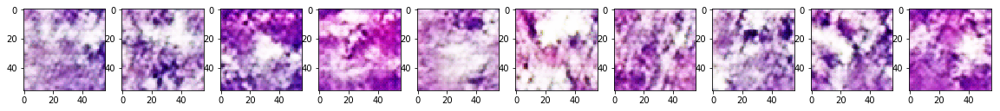

Epochs 1/3: Generator Loss: 1.037. Discriminator Loss: 1.108


Epochs 1/3: Generator Loss: 0.931. Discriminator Loss: 1.186


Epochs 1/3: Generator Loss: 1.273. Discriminator Loss: 1.052


Epochs 1/3: Generator Loss: 1.351. Discriminator Loss: 1.095


Epochs 1/3: Generator Loss: 1.254. Discriminator Loss: 0.975


Epochs 1/3: Generator Loss: 0.946. Discriminator Loss: 0.969


Epochs 1/3: Generator Loss: 1.101. Discriminator Loss: 1.065


Epochs 1/3: Generator Loss: 0.834. Discriminator Loss: 1.204


Epochs 1/3: Generator Loss: 1.148. Discriminator Loss: 1.214


Epochs 1/3: Generator Loss: 1.417. Discriminator Loss: 1.014


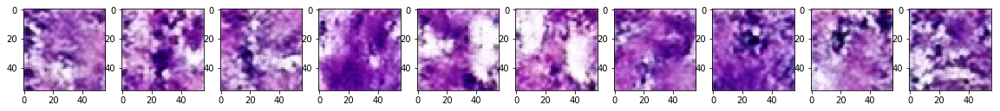

Epochs 1/3: Generator Loss: 1.68. Discriminator Loss: 0.874


Epochs 1/3: Generator Loss: 1.532. Discriminator Loss: 0.757


Epochs 1/3: Generator Loss: 1.174. Discriminator Loss: 0.87


Epochs 1/3: Generator Loss: 1.405. Discriminator Loss: 1.098


Epochs 1/3: Generator Loss: 0.944. Discriminator Loss: 0.985


Epochs 1/3: Generator Loss: 0.809. Discriminator Loss: 1.218


Epochs 1/3: Generator Loss: 1.182. Discriminator Loss: 0.873


Epochs 1/3: Generator Loss: 1.298. Discriminator Loss: 1.015


Epochs 1/3: Generator Loss: 1.088. Discriminator Loss: 0.973


Epochs 1/3: Generator Loss: 1.397. Discriminator Loss: 0.884


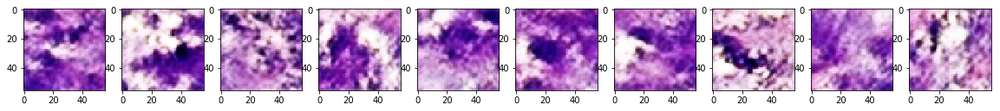

Epochs 1/3: Generator Loss: 1.378. Discriminator Loss: 0.817


Epochs 1/3: Generator Loss: 1.302. Discriminator Loss: 1.032


Epochs 1/3: Generator Loss: 1.351. Discriminator Loss: 0.757


Epochs 1/3: Generator Loss: 1.06. Discriminator Loss: 0.9


Epochs 1/3: Generator Loss: 1.61. Discriminator Loss: 0.739


Epochs 1/3: Generator Loss: 1.302. Discriminator Loss: 1.018


Epochs 1/3: Generator Loss: 1.125. Discriminator Loss: 0.927


Epochs 1/3: Generator Loss: 1.135. Discriminator Loss: 0.875


Epochs 1/3: Generator Loss: 1.124. Discriminator Loss: 1.003


Epochs 1/3: Generator Loss: 1.721. Discriminator Loss: 0.747


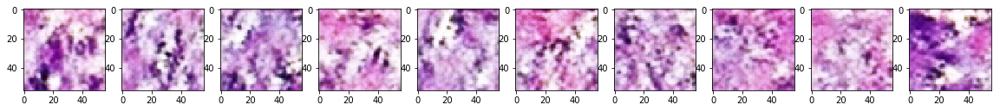

Epochs 1/3: Generator Loss: 1.249. Discriminator Loss: 0.86


Epochs 1/3: Generator Loss: 1.626. Discriminator Loss: 0.829


Epochs 1/3: Generator Loss: 1.83. Discriminator Loss: 0.702


Epochs 1/3: Generator Loss: 1.68. Discriminator Loss: 0.882


Epochs 1/3: Generator Loss: 1.683. Discriminator Loss: 0.638


Epochs 1/3: Generator Loss: 1.471. Discriminator Loss: 0.729


Epochs 1/3: Generator Loss: 1.621. Discriminator Loss: 0.727


Epochs 1/3: Generator Loss: 1.441. Discriminator Loss: 0.856


Epochs 1/3: Generator Loss: 1.48. Discriminator Loss: 0.891


Epochs 1/3: Generator Loss: 0.911. Discriminator Loss: 1.119


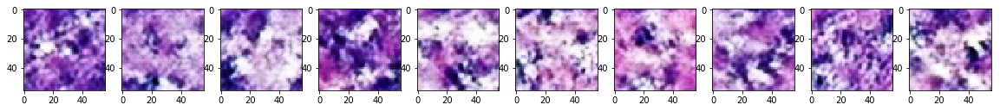

Epochs 1/3: Generator Loss: 1.365. Discriminator Loss: 0.813


Epochs 1/3: Generator Loss: 1.08. Discriminator Loss: 0.905


Epochs 1/3: Generator Loss: 1.876. Discriminator Loss: 0.703


Epochs 1/3: Generator Loss: 1.278. Discriminator Loss: 0.88


Epochs 1/3: Generator Loss: 0.895. Discriminator Loss: 1.209


Epochs 1/3: Generator Loss: 1.749. Discriminator Loss: 0.843


Epochs 1/3: Generator Loss: 1.371. Discriminator Loss: 0.756


Epochs 1/3: Generator Loss: 1.479. Discriminator Loss: 0.765


Epochs 1/3: Generator Loss: 1.496. Discriminator Loss: 0.717


Epochs 1/3: Generator Loss: 2.539. Discriminator Loss: 0.558


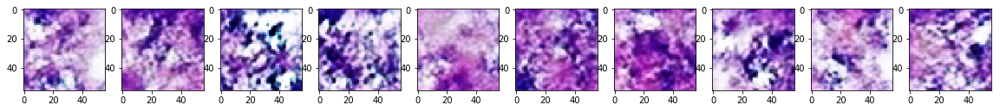

Epochs 1/3: Generator Loss: 1.405. Discriminator Loss: 0.909


Epochs 1/3: Generator Loss: 1.246. Discriminator Loss: 0.914


Epochs 1/3: Generator Loss: 1.448. Discriminator Loss: 0.672


Epochs 1/3: Generator Loss: 1.886. Discriminator Loss: 0.71


Epochs 1/3: Generator Loss: 2.824. Discriminator Loss: 1.564


Epochs 1/3: Generator Loss: 2.018. Discriminator Loss: 0.661


Epochs 1/3: Generator Loss: 1.906. Discriminator Loss: 0.629


Epochs 1/3: Generator Loss: 1.444. Discriminator Loss: 0.774


Epochs 1/3: Generator Loss: 1.333. Discriminator Loss: 0.913


Epochs 1/3: Generator Loss: 1.171. Discriminator Loss: 0.835


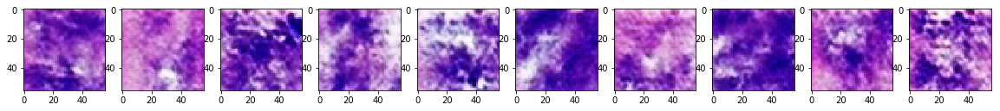

Epochs 1/3: Generator Loss: 2.293. Discriminator Loss: 0.959


Epochs 1/3: Generator Loss: 1.409. Discriminator Loss: 0.831


Epochs 1/3: Generator Loss: 1.691. Discriminator Loss: 0.911


Epochs 1/3: Generator Loss: 1.331. Discriminator Loss: 0.866


Epochs 1/3: Generator Loss: 2.143. Discriminator Loss: 0.667


Epochs 1/3: Generator Loss: 1.958. Discriminator Loss: 0.671


Epochs 1/3: Generator Loss: 0.951. Discriminator Loss: 0.998


Epochs 1/3: Generator Loss: 1.064. Discriminator Loss: 0.908


Epochs 1/3: Generator Loss: 1.677. Discriminator Loss: 0.787


Epochs 1/3: Generator Loss: 1.418. Discriminator Loss: 0.874


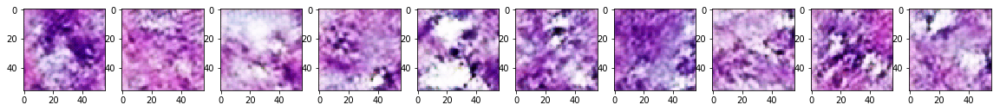

Epochs 1/3: Generator Loss: 2.899. Discriminator Loss: 0.518


Epochs 1/3: Generator Loss: 1.055. Discriminator Loss: 0.971


Epochs 1/3: Generator Loss: 2.87. Discriminator Loss: 0.594


Epochs 1/3: Generator Loss: 0.955. Discriminator Loss: 0.924


Epochs 1/3: Generator Loss: 1.81. Discriminator Loss: 0.684


Epochs 1/3: Generator Loss: 1.338. Discriminator Loss: 0.717


Epochs 1/3: Generator Loss: 2.365. Discriminator Loss: 0.629


Epochs 1/3: Generator Loss: 1.351. Discriminator Loss: 0.875


Epochs 1/3: Generator Loss: 1.56. Discriminator Loss: 1.345


Epochs 1/3: Generator Loss: 1.469. Discriminator Loss: 0.704


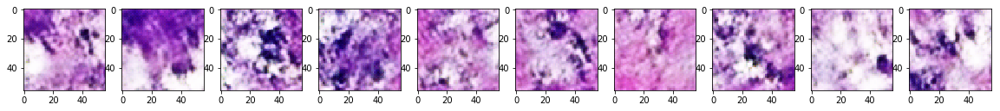

Epochs 1/3: Generator Loss: 0.918. Discriminator Loss: 0.963


Epochs 1/3: Generator Loss: 1.456. Discriminator Loss: 0.744


Epochs 1/3: Generator Loss: 1.087. Discriminator Loss: 0.882


Epochs 1/3: Generator Loss: 1.326. Discriminator Loss: 0.763


Epochs 1/3: Generator Loss: 2.52. Discriminator Loss: 0.542


Epochs 1/3: Generator Loss: 2.122. Discriminator Loss: 0.771


Epochs 1/3: Generator Loss: 1.924. Discriminator Loss: 0.633


Epochs 1/3: Generator Loss: 2.786. Discriminator Loss: 0.772


Epochs 1/3: Generator Loss: 2.126. Discriminator Loss: 0.585


Epochs 1/3: Generator Loss: 2.498. Discriminator Loss: 0.899


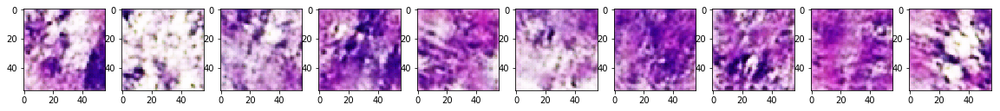

Epochs 1/3: Generator Loss: 1.136. Discriminator Loss: 0.913


Epochs 1/3: Generator Loss: 1.694. Discriminator Loss: 0.673


Epochs 1/3: Generator Loss: 1.024. Discriminator Loss: 0.912


Epochs 1/3: Generator Loss: 2.097. Discriminator Loss: 0.672


Epochs 1/3: Generator Loss: 1.229. Discriminator Loss: 0.781


Epochs 1/3: Generator Loss: 1.49. Discriminator Loss: 0.829


Epochs 1/3: Generator Loss: 1.288. Discriminator Loss: 0.75


Epochs 1/3: Generator Loss: 1.731. Discriminator Loss: 0.775


Epochs 1/3: Generator Loss: 1.756. Discriminator Loss: 0.728


Epochs 1/3: Generator Loss: 2.907. Discriminator Loss: 0.461


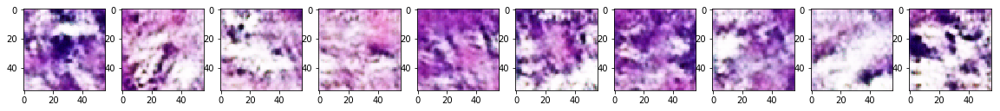

Epochs 1/3: Generator Loss: 1.911. Discriminator Loss: 0.877


Epochs 1/3: Generator Loss: 2.196. Discriminator Loss: 0.65


Epochs 1/3: Generator Loss: 1.244. Discriminator Loss: 0.776


Epochs 1/3: Generator Loss: 1.947. Discriminator Loss: 0.787


Epochs 1/3: Generator Loss: 1.719. Discriminator Loss: 0.591


Epochs 1/3: Generator Loss: 1.506. Discriminator Loss: 0.676


Epochs 1/3: Generator Loss: 0.702. Discriminator Loss: 1.172


Epochs 1/3: Generator Loss: 1.529. Discriminator Loss: 0.741


Epochs 1/3: Generator Loss: 2.516. Discriminator Loss: 0.505


Epochs 1/3: Generator Loss: 1.366. Discriminator Loss: 1.821


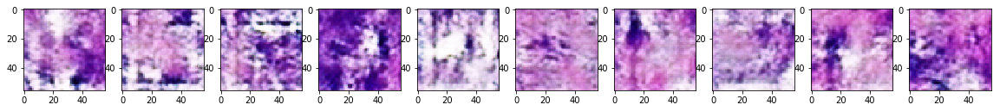

Epochs 1/3: Generator Loss: 1.972. Discriminator Loss: 0.571


Epochs 1/3: Generator Loss: 1.768. Discriminator Loss: 0.611


Epochs 1/3: Generator Loss: 1.901. Discriminator Loss: 0.605


Epochs 1/3: Generator Loss: 2.543. Discriminator Loss: 0.52


Epochs 1/3: Generator Loss: 1.083. Discriminator Loss: 0.852


Epochs 1/3: Generator Loss: 1.512. Discriminator Loss: 0.656


Epochs 1/3: Generator Loss: 2.09. Discriminator Loss: 0.801


Epochs 1/3: Generator Loss: 1.167. Discriminator Loss: 0.854


Epochs 1/3: Generator Loss: 1.619. Discriminator Loss: 0.66


Epochs 1/3: Generator Loss: 1.983. Discriminator Loss: 0.741


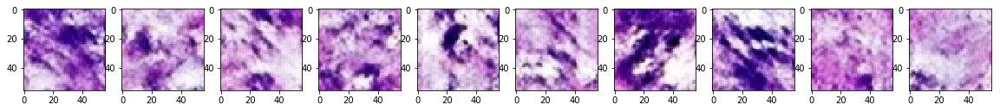

Epochs 1/3: Generator Loss: 1.263. Discriminator Loss: 0.815


Epochs 1/3: Generator Loss: 2.204. Discriminator Loss: 0.599


Epochs 1/3: Generator Loss: 2.176. Discriminator Loss: 0.537


Epochs 1/3: Generator Loss: 1.373. Discriminator Loss: 0.74


Epochs 1/3: Generator Loss: 2.069. Discriminator Loss: 0.572


Epochs 1/3: Generator Loss: 2.424. Discriminator Loss: 0.742


Epochs 1/3: Generator Loss: 1.511. Discriminator Loss: 0.687


Epochs 1/3: Generator Loss: 1.372. Discriminator Loss: 0.763


Epochs 1/3: Generator Loss: 2.566. Discriminator Loss: 0.542


Epochs 1/3: Generator Loss: 1.884. Discriminator Loss: 0.766


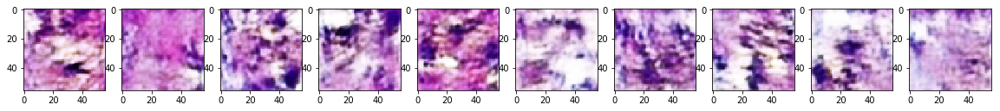

Epochs 1/3: Generator Loss: 2.239. Discriminator Loss: 0.573


Epochs 1/3: Generator Loss: 2.09. Discriminator Loss: 0.906


Epochs 1/3: Generator Loss: 2.276. Discriminator Loss: 0.715


Epochs 1/3: Generator Loss: 1.759. Discriminator Loss: 0.836


Epochs 1/3: Generator Loss: 1.907. Discriminator Loss: 0.782


Epochs 1/3: Generator Loss: 1.548. Discriminator Loss: 0.674


Epochs 1/3: Generator Loss: 2.479. Discriminator Loss: 0.465


Epochs 1/3: Generator Loss: 1.592. Discriminator Loss: 0.721


Epochs 1/3: Generator Loss: 1.148. Discriminator Loss: 0.944


Epochs 1/3: Generator Loss: 2.655. Discriminator Loss: 0.641


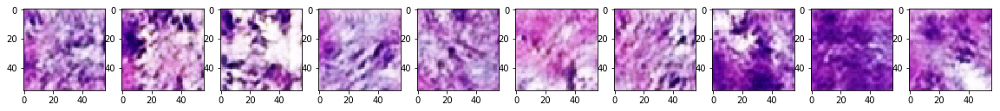

Epochs 1/3: Generator Loss: 3.053. Discriminator Loss: 0.565


Epochs 1/3: Generator Loss: 1.347. Discriminator Loss: 0.762


Epochs 1/3: Generator Loss: 1.478. Discriminator Loss: 0.721


Epochs 1/3: Generator Loss: 1.135. Discriminator Loss: 0.835


Epochs 1/3: Generator Loss: 1.44. Discriminator Loss: 0.685


Epochs 1/3: Generator Loss: 2.03. Discriminator Loss: 0.591


Epochs 1/3: Generator Loss: 1.943. Discriminator Loss: 0.555


Epochs 1/3: Generator Loss: 1.732. Discriminator Loss: 0.84


Epochs 1/3: Generator Loss: 1.326. Discriminator Loss: 0.703


Epochs 1/3: Generator Loss: 2.465. Discriminator Loss: 0.547


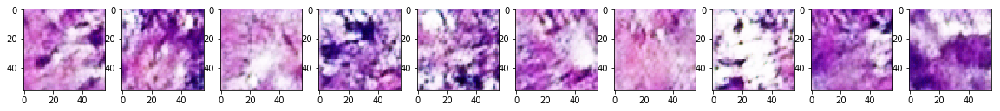

Epochs 1/3: Generator Loss: 2.267. Discriminator Loss: 0.598


Epochs 1/3: Generator Loss: 2.727. Discriminator Loss: 0.483


Epochs 1/3: Generator Loss: 1.878. Discriminator Loss: 0.587


Epochs 1/3: Generator Loss: 2.478. Discriminator Loss: 0.592


Epochs 1/3: Generator Loss: 2.416. Discriminator Loss: 0.607


Epochs 1/3: Generator Loss: 2.706. Discriminator Loss: 0.803


Epochs 1/3: Generator Loss: 2.083. Discriminator Loss: 0.59


Epochs 1/3: Generator Loss: 3.041. Discriminator Loss: 0.451


Epochs 1/3: Generator Loss: 2.197. Discriminator Loss: 0.779


Epochs 1/3: Generator Loss: 1.908. Discriminator Loss: 0.627


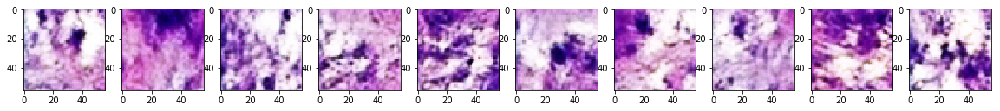

Epochs 1/3: Generator Loss: 2.596. Discriminator Loss: 0.473


Epochs 1/3: Generator Loss: 2.388. Discriminator Loss: 0.838


Epochs 1/3: Generator Loss: 1.713. Discriminator Loss: 0.884


Epochs 1/3: Generator Loss: 1.934. Discriminator Loss: 0.612


Epochs 1/3: Generator Loss: 3.143. Discriminator Loss: 0.478


Epochs 1/3: Generator Loss: 1.214. Discriminator Loss: 0.862


Epochs 1/3: Generator Loss: 2.598. Discriminator Loss: 0.456


Epochs 1/3: Generator Loss: 3.131. Discriminator Loss: 0.488


Epochs 1/3: Generator Loss: 3.131. Discriminator Loss: 0.51


Epochs 1/3: Generator Loss: 2.783. Discriminator Loss: 0.568


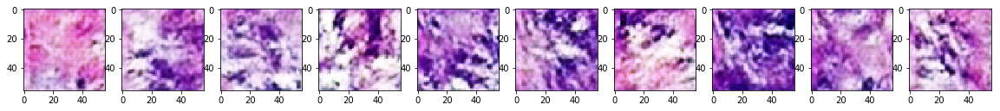

Epochs 1/3: Generator Loss: 1.898. Discriminator Loss: 0.581


Epochs 1/3: Generator Loss: 2.678. Discriminator Loss: 0.511


Epochs 1/3: Generator Loss: 1.854. Discriminator Loss: 0.569


Epochs 1/3: Generator Loss: 1.234. Discriminator Loss: 0.766


Epochs 1/3: Generator Loss: 1.957. Discriminator Loss: 0.589


Epochs 1/3: Generator Loss: 2.168. Discriminator Loss: 0.62


Epochs 1/3: Generator Loss: 0.795. Discriminator Loss: 1.149


Epochs 1/3: Generator Loss: 0.717. Discriminator Loss: 1.244


Epochs 1/3: Generator Loss: 3.644. Discriminator Loss: 0.537


Epochs 1/3: Generator Loss: 2.107. Discriminator Loss: 0.579


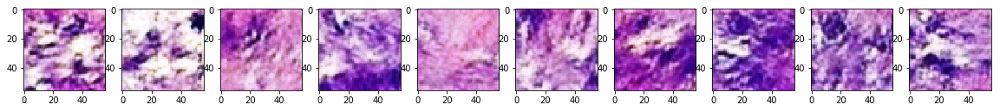

Epochs 1/3: Generator Loss: 2.372. Discriminator Loss: 0.573


Epochs 1/3: Generator Loss: 2.1. Discriminator Loss: 0.584


Epochs 1/3: Generator Loss: 2.198. Discriminator Loss: 0.55


Epochs 1/3: Generator Loss: 1.158. Discriminator Loss: 1.084


Epochs 1/3: Generator Loss: 1.692. Discriminator Loss: 0.638


Epochs 1/3: Generator Loss: 2.076. Discriminator Loss: 0.545


Epochs 1/3: Generator Loss: 1.579. Discriminator Loss: 0.665


Epochs 1/3: Generator Loss: 2.872. Discriminator Loss: 0.638


Epochs 1/3: Generator Loss: 2.311. Discriminator Loss: 0.515


Epochs 1/3: Generator Loss: 1.843. Discriminator Loss: 0.62


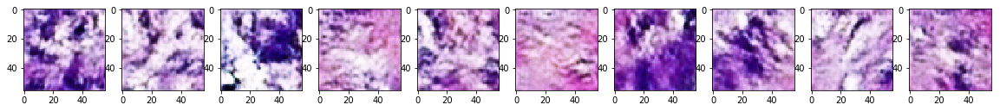

Epochs 1/3: Generator Loss: 2.839. Discriminator Loss: 0.504


Epochs 1/3: Generator Loss: 2.171. Discriminator Loss: 0.553


Epochs 1/3: Generator Loss: 1.989. Discriminator Loss: 0.777


Epochs 1/3: Generator Loss: 1.778. Discriminator Loss: 0.598


Epochs 1/3: Generator Loss: 3.226. Discriminator Loss: 0.47


Epochs 1/3: Generator Loss: 1.065. Discriminator Loss: 1.061


Epochs 1/3: Generator Loss: 1.587. Discriminator Loss: 0.629


Epochs 1/3: Generator Loss: 1.071. Discriminator Loss: 0.864


Epochs 1/3: Generator Loss: 2.146. Discriminator Loss: 0.55


Epochs 1/3: Generator Loss: 2.35. Discriminator Loss: 0.485


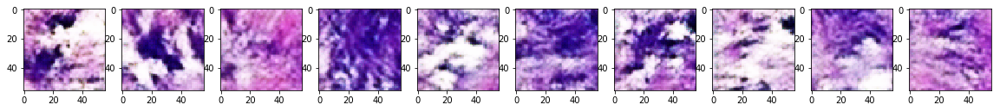

Epochs 1/3: Generator Loss: 2.957. Discriminator Loss: 0.523


Epochs 1/3: Generator Loss: 1.288. Discriminator Loss: 0.799


Epochs 1/3: Generator Loss: 3.145. Discriminator Loss: 0.708


Epochs 1/3: Generator Loss: 2.372. Discriminator Loss: 0.49


Epochs 1/3: Generator Loss: 2.379. Discriminator Loss: 0.579


Epochs 1/3: Generator Loss: 0.705. Discriminator Loss: 1.26


Epochs 1/3: Generator Loss: 2.238. Discriminator Loss: 0.658


Epochs 1/3: Generator Loss: 1.738. Discriminator Loss: 0.624


Epochs 1/3: Generator Loss: 2.614. Discriminator Loss: 0.483


Epochs 1/3: Generator Loss: 1.561. Discriminator Loss: 0.68


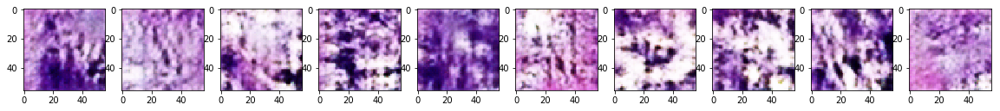

Epochs 1/3: Generator Loss: 3.109. Discriminator Loss: 0.443


Epochs 1/3: Generator Loss: 1.573. Discriminator Loss: 0.707


Epochs 1/3: Generator Loss: 1.137. Discriminator Loss: 0.794


Epochs 1/3: Generator Loss: 2.165. Discriminator Loss: 0.553


Epochs 1/3: Generator Loss: 2.322. Discriminator Loss: 0.546


Epochs 1/3: Generator Loss: 1.276. Discriminator Loss: 0.788


Epochs 1/3: Generator Loss: 0.881. Discriminator Loss: 1.089


Epochs 1/3: Generator Loss: 2.403. Discriminator Loss: 0.598


Epochs 1/3: Generator Loss: 1.614. Discriminator Loss: 0.638


Epochs 1/3: Generator Loss: 3.025. Discriminator Loss: 0.444


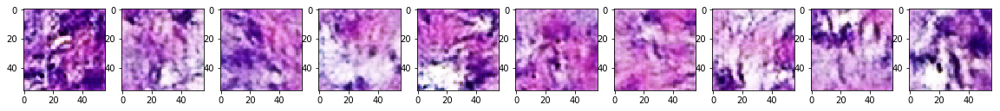

Epochs 1/3: Generator Loss: 1.749. Discriminator Loss: 0.668


Epochs 1/3: Generator Loss: 3.504. Discriminator Loss: 0.926


Epochs 1/3: Generator Loss: 1.755. Discriminator Loss: 0.555


Epochs 1/3: Generator Loss: 2.453. Discriminator Loss: 0.464


Epochs 1/3: Generator Loss: 2.853. Discriminator Loss: 0.539


Epochs 1/3: Generator Loss: 3.257. Discriminator Loss: 0.986


Epochs 1/3: Generator Loss: 2.545. Discriminator Loss: 0.469


Epochs 1/3: Generator Loss: 1.887. Discriminator Loss: 0.586


Epochs 1/3: Generator Loss: 1.802. Discriminator Loss: 0.611


Epochs 1/3: Generator Loss: 1.868. Discriminator Loss: 0.568


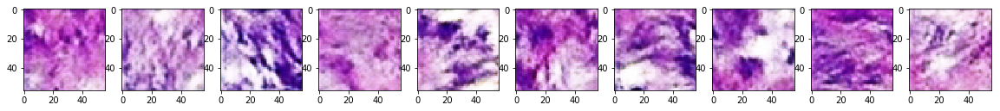

Epochs 1/3: Generator Loss: 1.871. Discriminator Loss: 0.71


Epochs 1/3: Generator Loss: 2.579. Discriminator Loss: 0.475


Epochs 1/3: Generator Loss: 1.275. Discriminator Loss: 0.788


Epochs 1/3: Generator Loss: 3.125. Discriminator Loss: 0.488


Epochs 1/3: Generator Loss: 3.64. Discriminator Loss: 1.064


Epochs 1/3: Generator Loss: 2.11. Discriminator Loss: 0.822


Epochs 1/3: Generator Loss: 3.531. Discriminator Loss: 0.574


Epochs 1/3: Generator Loss: 0.983. Discriminator Loss: 0.929


Epochs 1/3: Generator Loss: 2.835. Discriminator Loss: 0.516


Epochs 1/3: Generator Loss: 2.962. Discriminator Loss: 0.571


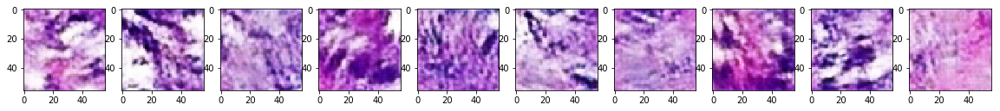

Epochs 1/3: Generator Loss: 1.43. Discriminator Loss: 0.714


Epochs 1/3: Generator Loss: 1.708. Discriminator Loss: 0.722


Epochs 1/3: Generator Loss: 3.222. Discriminator Loss: 0.517


Epochs 1/3: Generator Loss: 3.891. Discriminator Loss: 0.448


Epochs 1/3: Generator Loss: 1.755. Discriminator Loss: 0.666


Epochs 1/3: Generator Loss: 3.02. Discriminator Loss: 0.436


Epochs 1/3: Generator Loss: 2.532. Discriminator Loss: 0.508


Epochs 1/3: Generator Loss: 3.582. Discriminator Loss: 0.422


Epochs 1/3: Generator Loss: 2.194. Discriminator Loss: 0.498


Epochs 1/3: Generator Loss: 1.462. Discriminator Loss: 0.758


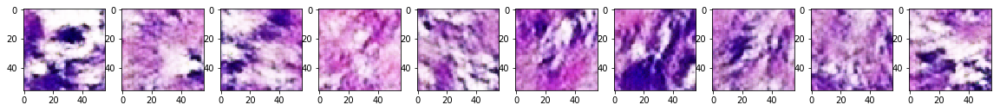

Epochs 1/3: Generator Loss: 2.322. Discriminator Loss: 0.496


Epochs 1/3: Generator Loss: 2.091. Discriminator Loss: 0.551


Epochs 1/3: Generator Loss: 1.781. Discriminator Loss: 0.745


Epochs 1/3: Generator Loss: 2.935. Discriminator Loss: 0.45


Epochs 1/3: Generator Loss: 1.932. Discriminator Loss: 0.542


Epochs 1/3: Generator Loss: 2.764. Discriminator Loss: 0.442


Epochs 1/3: Generator Loss: 2.364. Discriminator Loss: 0.592


Epochs 1/3: Generator Loss: 1.751. Discriminator Loss: 0.638


Epochs 1/3: Generator Loss: 1.812. Discriminator Loss: 0.615


Epochs 1/3: Generator Loss: 1.694. Discriminator Loss: 0.633


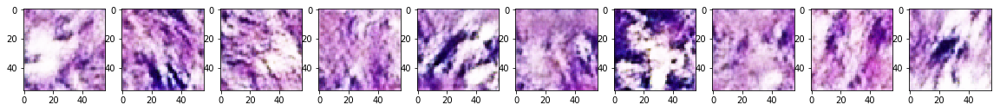

Epochs 1/3: Generator Loss: 3.019. Discriminator Loss: 0.483


Epochs 1/3: Generator Loss: 3.535. Discriminator Loss: 0.868


Epochs 1/3: Generator Loss: 1.557. Discriminator Loss: 0.776


Epochs 1/3: Generator Loss: 1.389. Discriminator Loss: 0.703


Epochs 1/3: Generator Loss: 1.212. Discriminator Loss: 0.757


Epochs 1/3: Generator Loss: 2.224. Discriminator Loss: 0.582


Epochs 1/3: Generator Loss: 2.457. Discriminator Loss: 0.525


Epochs 1/3: Generator Loss: 3.582. Discriminator Loss: 0.397


Epochs 1/3: Generator Loss: 1.848. Discriminator Loss: 0.564


Epochs 1/3: Generator Loss: 1.904. Discriminator Loss: 0.552


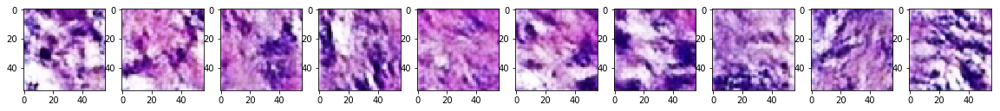

Epochs 1/3: Generator Loss: 1.235. Discriminator Loss: 0.882


Epochs 1/3: Generator Loss: 1.886. Discriminator Loss: 0.719


Epochs 1/3: Generator Loss: 2.888. Discriminator Loss: 0.531


Epochs 1/3: Generator Loss: 0.245. Discriminator Loss: 2.026


Epochs 1/3: Generator Loss: 3.717. Discriminator Loss: 0.468


Epochs 1/3: Generator Loss: 2.654. Discriminator Loss: 0.595


Epochs 1/3: Generator Loss: 2.764. Discriminator Loss: 0.439


Epochs 1/3: Generator Loss: 1.904. Discriminator Loss: 0.626


Epochs 1/3: Generator Loss: 2.999. Discriminator Loss: 0.43


Epochs 1/3: Generator Loss: 4.083. Discriminator Loss: 0.428


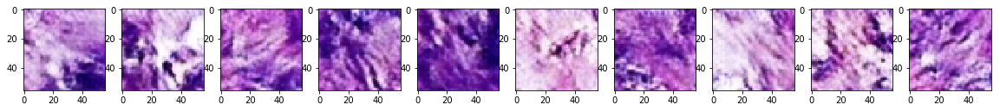

Epochs 1/3: Generator Loss: 2.218. Discriminator Loss: 0.504


Epochs 1/3: Generator Loss: 2.213. Discriminator Loss: 1.05


Epochs 1/3: Generator Loss: 3.356. Discriminator Loss: 0.428


Epochs 1/3: Generator Loss: 1.158. Discriminator Loss: 0.872


Epochs 1/3: Generator Loss: 1.921. Discriminator Loss: 0.56


Epochs 1/3: Generator Loss: 2.138. Discriminator Loss: 0.636


Epochs 1/3: Generator Loss: 2.667. Discriminator Loss: 0.526


Epochs 1/3: Generator Loss: 1.383. Discriminator Loss: 0.703


Epochs 1/3: Generator Loss: 1.802. Discriminator Loss: 0.626


Epochs 1/3: Generator Loss: 2.589. Discriminator Loss: 0.489


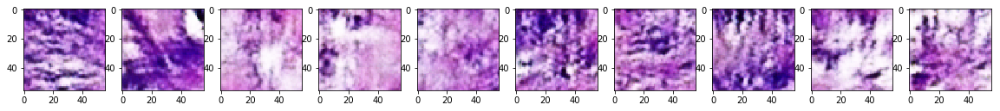

Epochs 1/3: Generator Loss: 2.736. Discriminator Loss: 0.475


Epochs 1/3: Generator Loss: 1.971. Discriminator Loss: 0.603


Epochs 1/3: Generator Loss: 2.74. Discriminator Loss: 0.455


Epochs 1/3: Generator Loss: 1.414. Discriminator Loss: 0.748


Epochs 1/3: Generator Loss: 4.061. Discriminator Loss: 0.405


Epochs 1/3: Generator Loss: 2.649. Discriminator Loss: 0.497


Epochs 1/3: Generator Loss: 1.653. Discriminator Loss: 0.664


Epochs 1/3: Generator Loss: 3.376. Discriminator Loss: 0.767


Epochs 1/3: Generator Loss: 1.811. Discriminator Loss: 0.599


Epochs 1/3: Generator Loss: 1.948. Discriminator Loss: 0.688


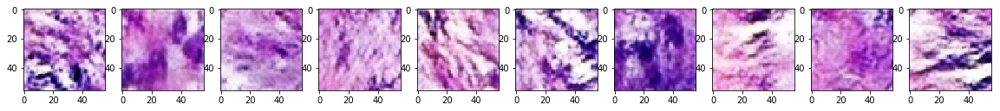

Epochs 1/3: Generator Loss: 2.387. Discriminator Loss: 0.619


Epochs 1/3: Generator Loss: 2.799. Discriminator Loss: 0.464


Epochs 1/3: Generator Loss: 2.116. Discriminator Loss: 0.517


Epochs 1/3: Generator Loss: 1.859. Discriminator Loss: 0.769


Epochs 1/3: Generator Loss: 2.397. Discriminator Loss: 0.494


Epochs 1/3: Generator Loss: 3.196. Discriminator Loss: 0.434


Epochs 1/3: Generator Loss: 1.955. Discriminator Loss: 0.54


Epochs 1/3: Generator Loss: 3.334. Discriminator Loss: 0.411


Epochs 1/3: Generator Loss: 3.156. Discriminator Loss: 0.437


Epochs 1/3: Generator Loss: 1.978. Discriminator Loss: 0.539


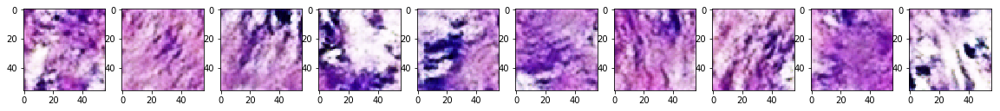

Epochs 1/3: Generator Loss: 2.39. Discriminator Loss: 0.537


Epochs 1/3: Generator Loss: 2.466. Discriminator Loss: 0.49


Epochs 1/3: Generator Loss: 2.525. Discriminator Loss: 0.486


Epochs 1/3: Generator Loss: 3.512. Discriminator Loss: 0.421


Epochs 1/3: Generator Loss: 1.162. Discriminator Loss: 0.882


Epochs 1/3: Generator Loss: 2.947. Discriminator Loss: 0.495


Epochs 1/3: Generator Loss: 1.915. Discriminator Loss: 0.529


Epochs 1/3: Generator Loss: 1.582. Discriminator Loss: 0.65


Epochs 1/3: Generator Loss: 4.423. Discriminator Loss: 0.379


Epochs 1/3: Generator Loss: 1.878. Discriminator Loss: 0.693


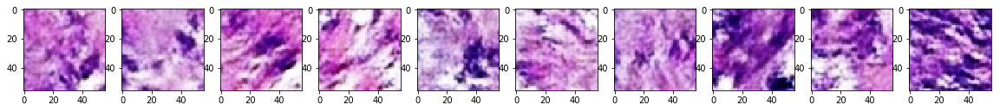

Epochs 1/3: Generator Loss: 1.641. Discriminator Loss: 0.615


Epochs 1/3: Generator Loss: 3.207. Discriminator Loss: 0.413


Epochs 1/3: Generator Loss: 3.295. Discriminator Loss: 0.414


Epochs 1/3: Generator Loss: 1.817. Discriminator Loss: 0.631


Epochs 1/3: Generator Loss: 0.926. Discriminator Loss: 0.922


Epochs 1/3: Generator Loss: 1.77. Discriminator Loss: 0.713


Epochs 1/3: Generator Loss: 4.707. Discriminator Loss: 0.482


Epochs 1/3: Generator Loss: 2.789. Discriminator Loss: 0.44


Epochs 1/3: Generator Loss: 2.401. Discriminator Loss: 0.481


Epochs 1/3: Generator Loss: 2.168. Discriminator Loss: 0.588


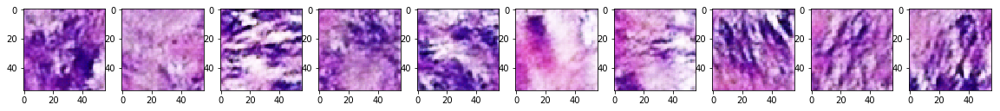

Epochs 1/3: Generator Loss: 2.538. Discriminator Loss: 0.499


Epochs 1/3: Generator Loss: 2.927. Discriminator Loss: 0.538


Epochs 1/3: Generator Loss: 1.917. Discriminator Loss: 0.527


Epochs 1/3: Generator Loss: 3.16. Discriminator Loss: 0.993


Epochs 1/3: Generator Loss: 2.491. Discriminator Loss: 0.528


Epochs 1/3: Generator Loss: 3.095. Discriminator Loss: 0.425


Epochs 1/3: Generator Loss: 3.627. Discriminator Loss: 0.436


Epochs 1/3: Generator Loss: 1.086. Discriminator Loss: 0.962


Epochs 1/3: Generator Loss: 1.448. Discriminator Loss: 0.711


Epochs 1/3: Generator Loss: 3.101. Discriminator Loss: 0.558


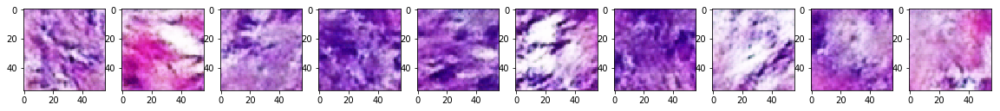

Epochs 1/3: Generator Loss: 1.837. Discriminator Loss: 0.593


Epochs 1/3: Generator Loss: 1.929. Discriminator Loss: 0.55


Epochs 1/3: Generator Loss: 3.05. Discriminator Loss: 0.769


Epochs 1/3: Generator Loss: 2.393. Discriminator Loss: 0.469


Epochs 1/3: Generator Loss: 1.57. Discriminator Loss: 0.634


Epochs 1/3: Generator Loss: 2.793. Discriminator Loss: 0.515


Epochs 1/3: Generator Loss: 2.062. Discriminator Loss: 0.564


Epochs 1/3: Generator Loss: 1.936. Discriminator Loss: 0.583


Epochs 1/3: Generator Loss: 2.107. Discriminator Loss: 0.606


Epochs 1/3: Generator Loss: 4.482. Discriminator Loss: 0.36


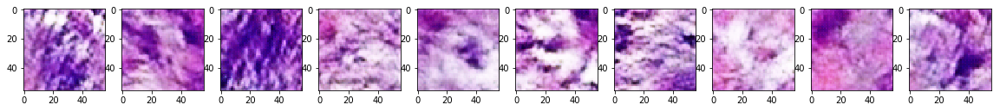

Epochs 1/3: Generator Loss: 2.611. Discriminator Loss: 0.554


Epochs 1/3: Generator Loss: 1.619. Discriminator Loss: 0.667


Epochs 1/3: Generator Loss: 2.988. Discriminator Loss: 0.509


Epochs 1/3: Generator Loss: 3.782. Discriminator Loss: 1.599


Epochs 1/3: Generator Loss: 2.923. Discriminator Loss: 0.554


Epochs 1/3: Generator Loss: 2.983. Discriminator Loss: 0.415


Epochs 1/3: Generator Loss: 1.558. Discriminator Loss: 0.634


Epochs 1/3: Generator Loss: 2.176. Discriminator Loss: 0.518


Epochs 1/3: Generator Loss: 2.24. Discriminator Loss: 0.512


Epochs 1/3: Generator Loss: 3.446. Discriminator Loss: 0.416


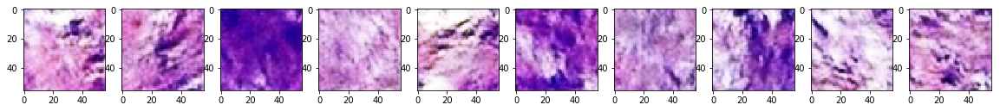

Epochs 1/3: Generator Loss: 2.681. Discriminator Loss: 0.452


Epochs 1/3: Generator Loss: 1.68. Discriminator Loss: 0.625


Epochs 1/3: Generator Loss: 2.377. Discriminator Loss: 0.64


Epochs 1/3: Generator Loss: 0.797. Discriminator Loss: 1.072


Epochs 1/3: Generator Loss: 0.327. Discriminator Loss: 1.747


Epochs 1/3: Generator Loss: 2.423. Discriminator Loss: 0.496


Epochs 1/3: Generator Loss: 1.847. Discriminator Loss: 0.609


Epochs 1/3: Generator Loss: 4.706. Discriminator Loss: 0.618


Epochs 1/3: Generator Loss: 1.824. Discriminator Loss: 0.638


Epochs 1/3: Generator Loss: 1.742. Discriminator Loss: 0.625


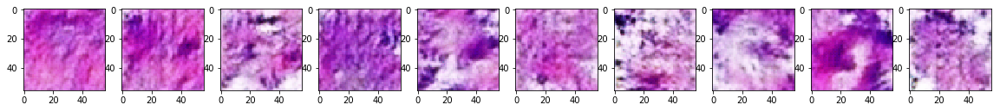

Epochs 1/3: Generator Loss: 2.341. Discriminator Loss: 0.496


Epochs 1/3: Generator Loss: 1.168. Discriminator Loss: 0.943


Epochs 1/3: Generator Loss: 1.933. Discriminator Loss: 0.578


Epochs 1/3: Generator Loss: 1.358. Discriminator Loss: 0.734


Epochs 1/3: Generator Loss: 3.44. Discriminator Loss: 0.447


Epochs 1/3: Generator Loss: 2.839. Discriminator Loss: 0.738


Epochs 1/3: Generator Loss: 1.531. Discriminator Loss: 0.754


Epochs 1/3: Generator Loss: 0.76. Discriminator Loss: 1.103


Epochs 1/3: Generator Loss: 2.648. Discriminator Loss: 0.481


Epochs 1/3: Generator Loss: 1.8. Discriminator Loss: 0.612


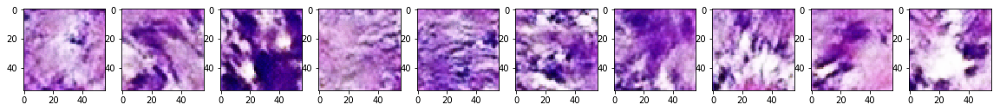

Epochs 1/3: Generator Loss: 4.39. Discriminator Loss: 0.388


Epochs 1/3: Generator Loss: 1.846. Discriminator Loss: 0.835


Epochs 1/3: Generator Loss: 1.606. Discriminator Loss: 0.825


Epochs 1/3: Generator Loss: 1.912. Discriminator Loss: 0.666


Epochs 1/3: Generator Loss: 1.1. Discriminator Loss: 0.824


Epochs 1/3: Generator Loss: 1.965. Discriminator Loss: 0.573


Epochs 1/3: Generator Loss: 2.48. Discriminator Loss: 0.483


Epochs 1/3: Generator Loss: 1.521. Discriminator Loss: 0.657


Epochs 1/3: Generator Loss: 3.058. Discriminator Loss: 0.506


Epochs 1/3: Generator Loss: 1.257. Discriminator Loss: 0.773


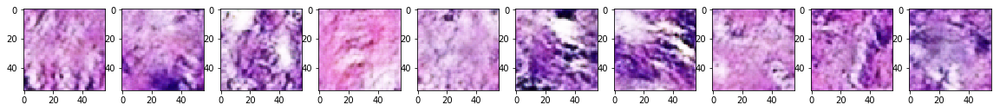

Epochs 1/3: Generator Loss: 3.568. Discriminator Loss: 0.568


Epochs 1/3: Generator Loss: 1.89. Discriminator Loss: 0.57


Epochs 1/3: Generator Loss: 2.116. Discriminator Loss: 0.503


Epochs 1/3: Generator Loss: 2.443. Discriminator Loss: 0.516


Epochs 1/3: Generator Loss: 0.875. Discriminator Loss: 1.042


Epochs 1/3: Generator Loss: 1.647. Discriminator Loss: 0.646


Epochs 1/3: Generator Loss: 1.777. Discriminator Loss: 0.615


Epochs 1/3: Generator Loss: 3.598. Discriminator Loss: 0.447


Epochs 1/3: Generator Loss: 2.245. Discriminator Loss: 0.491


Epochs 1/3: Generator Loss: 3.348. Discriminator Loss: 0.43


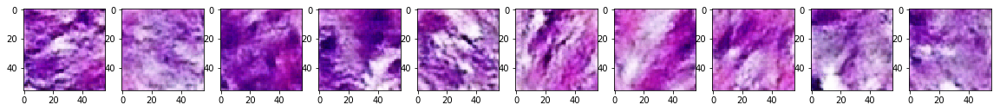

Epochs 1/3: Generator Loss: 3.143. Discriminator Loss: 0.406


Epochs 1/3: Generator Loss: 2.635. Discriminator Loss: 0.438


Epochs 1/3: Generator Loss: 2.363. Discriminator Loss: 0.557


Epochs 1/3: Generator Loss: 3.168. Discriminator Loss: 0.497


Epochs 1/3: Generator Loss: 1.674. Discriminator Loss: 0.691


Epochs 1/3: Generator Loss: 2.143. Discriminator Loss: 0.515


Epochs 1/3: Generator Loss: 1.992. Discriminator Loss: 0.626


Epochs 1/3: Generator Loss: 0.763. Discriminator Loss: 1.106


Epochs 1/3: Generator Loss: 2.073. Discriminator Loss: 0.552


Epochs 1/3: Generator Loss: 1.213. Discriminator Loss: 0.792


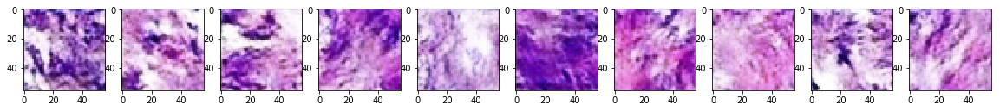

Epochs 1/3: Generator Loss: 5.041. Discriminator Loss: 0.399


Epochs 1/3: Generator Loss: 2.128. Discriminator Loss: 0.592


Epochs 1/3: Generator Loss: 2.978. Discriminator Loss: 0.469


Epochs 1/3: Generator Loss: 1.888. Discriminator Loss: 0.56


Epochs 1/3: Generator Loss: 3.012. Discriminator Loss: 0.428


Epochs 1/3: Generator Loss: 2.145. Discriminator Loss: 0.502


Epochs 1/3: Generator Loss: 1.464. Discriminator Loss: 0.717


Epochs 1/3: Generator Loss: 4.081. Discriminator Loss: 0.509


Epochs 1/3: Generator Loss: 1.862. Discriminator Loss: 0.621


Epochs 1/3: Generator Loss: 1.235. Discriminator Loss: 0.794


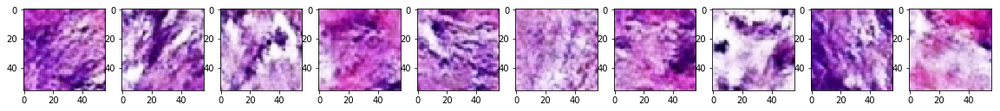

Epochs 1/3: Generator Loss: 3.453. Discriminator Loss: 0.512


Epochs 1/3: Generator Loss: 1.138. Discriminator Loss: 0.971


Epochs 1/3: Generator Loss: 0.615. Discriminator Loss: 1.265


Epochs 1/3: Generator Loss: 3.492. Discriminator Loss: 0.422


Epochs 1/3: Generator Loss: 0.976. Discriminator Loss: 0.896


Epochs 1/3: Generator Loss: 2.972. Discriminator Loss: 0.448


Epochs 1/3: Generator Loss: 1.509. Discriminator Loss: 1.582


Epochs 1/3: Generator Loss: 2.229. Discriminator Loss: 0.576


Epochs 1/3: Generator Loss: 2.065. Discriminator Loss: 0.627


Epochs 1/3: Generator Loss: 1.612. Discriminator Loss: 0.665


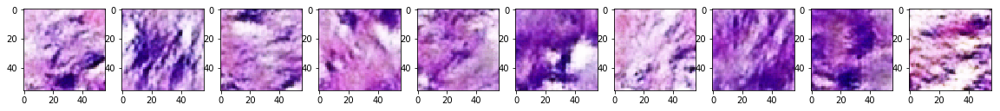

Epochs 1/3: Generator Loss: 1.39. Discriminator Loss: 0.74


Epochs 1/3: Generator Loss: 3.375. Discriminator Loss: 0.42


Epochs 1/3: Generator Loss: 0.943. Discriminator Loss: 0.953


Epochs 1/3: Generator Loss: 1.411. Discriminator Loss: 0.668


In [14]:
main_path = '/Users/adalbertoclaudioquiros/Documents/Code/UofG/PhD/Cancer_TMA_Generative/data model output/DCGAN/'

# Dataset information.
image_width = 56
image_height = 56
image_channels = 3
dataset='nki'
marker='he'
name_run = 'h%s_w%s_n%s_redo' % (image_height, image_width, image_channels)
data_out_path = '%s/%s' % (main_path, name_run)


# Hyperparameters.
epochs = 3
batch_size = 32
z_dim = 100
learning_rate = 2e-4
beta1 = 0.5
alpha = 0.2
use_bn = True

global losses 
global samples
data = Data(dataset, marker, image_height, image_width, image_channels, batch_size)

with tf.Graph().as_default():
   train(epochs, batch_size, z_dim, learning_rate, beta1, data, alpha, image_width, image_height, image_channels, data_out_path, use_bn)

save_loss(losses, data_out_path, dim=20)